In [1]:
import numpy as np
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import pandas as pd
import scanpy as sc
import anndata
import os
import sys
import seaborn as sns
import scipy as sp
import matplotlib.pyplot as plt

In [2]:
import plotnine as pl

In [3]:
pl.theme_set(pl.theme_bw(base_size=11))
pl.theme_update(axis_text=pl.element_text(color="black"),panel_grid_major = pl.element_blank(), panel_grid_minor = pl.element_blank(),panel_background = pl.element_rect(fill = "white"))

In [4]:
sys.path.insert(1, '/secure/projects/tacco/')
import tacco as tc

In [5]:
sys.path.insert(1, '/secure/projects/HTAPP_MBC/src/spatial')
from spatial_utils import *

In [6]:
combined_dir=out_dir_base+"/combined_all/"
os.makedirs(combined_dir, exist_ok=True)

In [7]:
sample_sheet=pd.read_csv(codeDir+"/meta/sampletracking_HTAPP_MBC_spatial.csv")

In [8]:
#sc sample annotation
sc_samples=pd.read_excel(codeDir+"/meta/clinical features2.xlsx")
sc_samples['sample']=sc_samples['htapp_id']+'-'+sc_samples['htapp_caseid']

In [9]:
sc_samples.head()

,ccpm_id,ccpm_id_long,sample,htapp,htapp_id,htapp_caseid,method,site_biopsy,receptors_biopsy,metastatic_presentation,biopsy_days_after_metastasis,histology_breast,known hereditary predisposition,treatment_status,treatment_current_class,treatment_most_recent_class
0,260,300260,HTAPP-225-SMP-6756,HTAPP,HTAPP-225,SMP-6756,snRNAseq,Breast,ER+/PR+/HER2-,De novo,846,Invasive lobular carcinoma,NaN,on-treatment,Endocrine,Endocrine
1,289,300289,HTAPP-983-SMP-7659,HTAPP,HTAPP-983,SMP-7659,scRNAseq,Liver,ER+/PR+/HER2+,De novo,1466,Invasive ductal carcinoma with mucinous features,ATM,between treatments,off-treatment,Chemotherapy
2,294,300294,HTAPP-589-SMP-2860,HTAPP,HTAPP-589,SMP-2860,snRNAseq,Liver,ER+/PR-/HER2-,Recurrent,823,Invasive ductal carcinoma,NaN,on-treatment,Endocrine + HER2-targeted,Endocrine + HER2-targeted
3,294,300294,HTAPP-589-SMP-2851,HTAPP,HTAPP-589,SMP-2851,snRNAseq,Brain,ER+/PR-/HER2+,Recurrent,900,Invasive ductal carcinoma,NaN,on-treatment,Endocrine,Endocrine
4,360,300360,HTAPP-231-SMP-6758,HTAPP,HTAPP-231,SMP-6758,snRNAseq,Liver,ER+/PR-/HER2-,Recurrent,675,Invasive ductal carcinoma,NaN,between treatments,off-treatment,Immunotherapy


In [10]:
#These identifiers are set as defaults in many functions. If names are changed, this has to be adapted when calling the functions.
ct_column='cell_type'
sm_methods=["slide_seq","merfish","merfish_bin","codex","exseq","exseq_bin"] #spatial mathod names are hard-coded for now because some methods need special treatments. Can be fixed by giving eatch method it's own variable.
sc_method="scRNAseq"
all_methods=[sc_method,*sm_methods]
all_methods

['scRNAseq',
 'slide_seq',
 'merfish',
 'merfish_bin',
 'codex',
 'exseq',
 'exseq_bin']

In [11]:
run_samples=list(filter(lambda a: not a in [''], list(sample_sheet['sample'].unique()))) 
run_samples

['HTAPP-944-SMP-7479',
 'HTAPP-895-SMP-7359',
 'HTAPP-880-SMP-7179',
 'HTAPP-878-SMP-7149',
 'HTAPP-812-SMP-8239',
 'HTAPP-514-SMP-6760',
 'HTAPP-982-SMP-7629',
 'HTAPP-997-SMP-7789',
 'HTAPP-917-SMP-4531',
 'HTAPP-853-SMP-4381',
 'HTAPP-313-SMP-932',
 'HTAPP-330-SMP-1082',
 'HTAPP-783-SMP-4081',
 'HTAPP-364-SMP-1321',
 'HTAPP-213-SMP-6752']

In [12]:
sc_samples=sc_samples.loc[sc_samples['sample'].isin(run_samples)][['sample','method','receptors_biopsy','site_biopsy']].set_index('sample')

In [13]:
sc_samples

,method,receptors_biopsy,site_biopsy
sample,,,
HTAPP-944-SMP-7479,snRNAseq,ER+/PR-/HER2-,Liver
HTAPP-514-SMP-6760,snRNAseq,ER-/PR-/HER2-,Axilla
HTAPP-895-SMP-7359,snRNAseq,ER+/PR+/HER2-,Liver
HTAPP-982-SMP-7629,scRNAseq,ER+/PR+/HER2-,Liver
HTAPP-213-SMP-6752,snRNAseq,ER-/PR-/HER2-,Chest wall
HTAPP-878-SMP-7149,snRNAseq,ER+/PR-/HER2-,Axilla
HTAPP-880-SMP-7179,snRNAseq,ER+/PR+/HER2-,Liver
HTAPP-364-SMP-1321,scRNAseq,ER+/PR-/HER2+,Liver
HTAPP-783-SMP-4081,scRNAseq,ER+/PR-/HER2-,Breast


In [14]:
adatas_combined=pd.Series([[] for i in range(len(all_methods))],index=all_methods,dtype=object) 
#add combined scRNAseq that was produced in the MERFISH analysis 
adatas_combined['scRNAseq']=sc.read_h5ad(out_dir_base+"/combined_merfish/scRNAseq.h5ad")
for method in sm_methods:
    adatas_combined[method]=sc.read(combined_dir+"/"+method+".h5ad",compression="gzip")

In [15]:
adatas_combined

scRNAseq       [[[View of AnnData object with n_obs × n_vars ...
slide_seq      [[[View of AnnData object with n_obs × n_vars ...
merfish        [[[View of AnnData object with n_obs × n_vars ...
merfish_bin    [[[View of AnnData object with n_obs × n_vars ...
codex          [[[View of AnnData object with n_obs × n_vars ...
exseq          [[[View of AnnData object with n_obs × n_vars ...
exseq_bin      [[[View of AnnData object with n_obs × n_vars ...
dtype: object

In [16]:
for method in sm_methods:
    adatas_combined[method].obsm['OT'].fillna(0,inplace=True)
    adatas_combined[method].obsm['RCTD'].fillna(0,inplace=True)
    adatas_combined[method].obsm['OT_max'].fillna(0,inplace=True)

for method in all_methods:    
    for col in sc_samples.columns:
        adatas_combined[method].obs[col]=adatas_combined[method].obs['sample'].map(sc_samples[col])

In [17]:
#add bins per method
for method in sm_methods:
    tc.utils.bin(adatas_combined[method].obs,bin_size=100,bin_keys=["x_100","y_100"]);
    tc.utils.hash(adatas_combined[method].obs,keys=["x_100","y_100","sample"],hash_key=["bin_100"]);

In [19]:
adatas_combined_macro=adatas_combined.copy()
for method in all_methods:
    print(method)
    adatas_combined_macro[method].obs=adatas_combined_macro[method].obs.rename(columns={"OT":"cell_type"})
    sub=adatas_combined_macro[method][adatas_combined_macro[method].obs["cell_type"].isin({"Macrophage"})].copy()
    adatas_combined_macro[method]=anndata.AnnData(X=sub.obsm["counts"],obsm=sub.obsm,obs=sub.obs,var=pd.DataFrame(index=sub.uns["counts_var"]))
    

scRNAseq
slide_seq
merfish
merfish_bin
codex
exseq
exseq_bin


In [274]:
for method in all_methods:
    print(method)
    if method =='scRNAseq':
        adatas_combined_macro[method]=create_scanpy(adatas_combined_macro[[method]],var_genes=None,batch_key='method',redo=False,process=True,mode=None)
    else:
        adatas_combined_macro[method]=create_scanpy(adatas_combined_macro[[method]],var_genes=None,batch_key=None,redo=False,process=True,mode=None)

scRNAseq


/secure/src/anaconda3/envs/scanpy/lib/python3.6/site-packages/anndata/_core/anndata.py:1210: ImplicitModificationWarning: Initializing view as actual.
Trying to set attribute `.obs` of view, copying.
... storing 'method' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'receptors_biopsy' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'site_biopsy' as categorical


slide_seq


/secure/src/anaconda3/envs/scanpy/lib/python3.6/site-packages/anndata/_core/anndata.py:1210: ImplicitModificationWarning: Initializing view as actual.
Trying to set attribute `.obs` of view, copying.
... storing 'method' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'receptors_biopsy' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'site_biopsy' as categorical
/secure/src/anaconda3/envs/scanpy/lib/python3.6/site-packages/anndata/_core/anndata.py:1210: ImplicitModificationWarning: Initializing view as actual.
Trying to set attribute `.obs` of view, copying.
... storing 'method' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'receptors_biopsy' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'site_biopsy' as categorical


merfish


/secure/src/anaconda3/envs/scanpy/lib/python3.6/site-packages/anndata/_core/anndata.py:1210: ImplicitModificationWarning: Initializing view as actual.
Trying to set attribute `.obs` of view, copying.


merfish_bin


... storing 'method' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'receptors_biopsy' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'site_biopsy' as categorical


codex


/secure/src/anaconda3/envs/scanpy/lib/python3.6/site-packages/scanpy/preprocessing/_highly_variable_genes.py:64: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
/secure/src/anaconda3/envs/scanpy/lib/python3.6/site-packages/anndata/_core/anndata.py:1210: ImplicitModificationWarning: Initializing view as actual.
Trying to set attribute `.obs` of view, copying.
... storing 'method' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'receptors_biopsy' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'site_biopsy' as categorical
/secure/src/anaconda3/envs/scanpy/lib/python3.6/site-packages/anndata/_core/anndata.py:1210: ImplicitModificationWarning: Initializing view as actual.
Trying to set attribute `.obs` of view, copying.
... storing 'method' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'receptors_biopsy' as categorical
Trying to set attribute `.obs` of view, copying.

exseq


/secure/src/anaconda3/envs/scanpy/lib/python3.6/site-packages/anndata/_core/anndata.py:1210: ImplicitModificationWarning: Initializing view as actual.
Trying to set attribute `.obs` of view, copying.
... storing 'method' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'receptors_biopsy' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'site_biopsy' as categorical


exseq_bin


In [275]:
for method in all_methods:
    adatas_combined_macro[method].write(combined_dir+"/"+method+"_macro.h5ad",compression="gzip")

In [14]:
adatas_combined_macro=pd.Series([[] for i in range(len(all_methods))],index=all_methods,dtype=object) 
for method in all_methods:
    adatas_combined_macro[method]=sc.read(combined_dir+"/"+method+"_macro.h5ad",compression="gzip")

In [15]:
matplotlib.rcParams['figure.dpi'] = low_dpi

### Define genes of interest

In [13]:
int_genes={'Canonical MP markers':['CD163','CD68','CD4','CD14','FCGR3A','FCGR1A','HLA-DRA','HLA-DPA1'],
           'Other MP markers':['C1QA','C1QB','MS4A4A','MSR1','MARCO','AIF1','CSF1R','SPP1','TFEC','FCN1','IL3RA','CD1C'], 
           'Unspecific MP markers':['NRP1','TMSB4X','FTH1','FTL'],
           'MP function':['CCL2','CXCL9','CXCL10','ITGAX','IFIT2','ISG15','ISG20','MMP9','MMP12','LYZ','CST3','S100A8','S100A9','APOE','APOC1','CD274','HIF1A','MKI67','CENPF'],
          'Other CT markers':['KRT19','ALB','IGKC','IGHM','MZB1','CD19','CD8A','CD3E','CD2','COL3A1','COL4A2','NCAM1','PTPRB','PDPN','CGA']}

In [20]:
codex_genes=int_genes.copy()
for k in codex_genes.keys():
    codex_genes[k] = [gene for gene in codex_genes[k] if gene in list(adatas_combined_macro['codex'].var.index)]
codex_genes

{'Canonical MP markers': ['CD4', 'FCGR3A', 'HLA-DRA'],
 'Other MP markers': ['IL3RA', 'CD1C'],
 'Unspecific MP markers': [],
 'MP function': ['ITGAX', 'ISG20', 'MMP12', 'CD274', 'HIF1A', 'MKI67'],
 'Other CT markers': ['KRT19',
  'IGHM',
  'CD19',
  'CD8A',
  'CD2',
  'COL4A2',
  'NCAM1',
  'PDPN']}

In [21]:
s_genes=int_genes.copy()
for k in s_genes.keys():
    s_genes[k] = [gene for gene in s_genes[k] if gene in list(adatas_combined_macro['slide_seq'].var.index)]
s_genes

{'Canonical MP markers': ['CD163',
  'CD68',
  'CD4',
  'CD14',
  'FCGR3A',
  'FCGR1A',
  'HLA-DRA',
  'HLA-DPA1'],
 'Other MP markers': ['C1QA',
  'C1QB',
  'MS4A4A',
  'MSR1',
  'MARCO',
  'AIF1',
  'CSF1R',
  'SPP1',
  'TFEC',
  'FCN1',
  'IL3RA',
  'CD1C'],
 'Unspecific MP markers': ['NRP1', 'TMSB4X', 'FTH1', 'FTL'],
 'MP function': ['CCL2',
  'CXCL9',
  'CXCL10',
  'ITGAX',
  'IFIT2',
  'ISG15',
  'ISG20',
  'MMP9',
  'MMP12',
  'LYZ',
  'CST3',
  'S100A8',
  'S100A9',
  'APOE',
  'APOC1',
  'CD274',
  'HIF1A',
  'MKI67',
  'CENPF'],
 'Other CT markers': ['KRT19',
  'ALB',
  'IGKC',
  'IGHM',
  'MZB1',
  'CD19',
  'CD8A',
  'CD3E',
  'CD2',
  'COL3A1',
  'COL4A2',
  'NCAM1',
  'PTPRB',
  'PDPN',
  'CGA']}

In [22]:
em_genes=int_genes.copy()
for k in em_genes.keys():
    em_genes[k] = [gene for gene in em_genes[k] if gene in list(adatas_combined_macro['merfish'].var.index)]
em_genes

{'Canonical MP markers': ['CD163',
  'CD68',
  'CD4',
  'CD14',
  'FCGR3A',
  'HLA-DRA',
  'HLA-DPA1'],
 'Other MP markers': ['C1QA',
  'C1QB',
  'MSR1',
  'AIF1',
  'SPP1',
  'TFEC',
  'FCN1',
  'IL3RA'],
 'Unspecific MP markers': [],
 'MP function': ['CCL2',
  'ITGAX',
  'ISG15',
  'ISG20',
  'MMP9',
  'MMP12',
  'LYZ',
  'CST3',
  'S100A8',
  'S100A9',
  'APOE',
  'APOC1',
  'CD274',
  'HIF1A',
  'MKI67',
  'CENPF'],
 'Other CT markers': ['KRT19',
  'MZB1',
  'CD19',
  'CD8A',
  'CD3E',
  'CD2',
  'COL3A1',
  'COL4A2',
  'NCAM1',
  'PTPRB',
  'PDPN']}

In [155]:
def plot_variable_grid_extended(adatas,methods,variables,gridspec_kw={'wspace':0.9,'hspace':0.4},width=6,height=4,basis='X_umap',vmax=None,vmin=None):
    n_methods=len(methods)
    n_variables=len(variables)
    fig,axs=plt.subplots(n_variables,n_methods,figsize=(width*n_methods,height*n_variables),gridspec_kw=gridspec_kw)
    for i,method in enumerate(methods):
        for j,variable in enumerate(variables): 
            if variable in adatas[method].raw.var.index:
                sc.pl.embedding(adatas[method],color=[variable],basis=basis,vmax=vmax,vmin=vmin,ax=axs[j,i], show=False,use_raw=True)
            axs[j,i].set_title(method+':'+variable)
    return(fig)

In [ ]:
plot_variable_grid_extended(adatas_combined_macro,methods=['scRNAseq','slide_seq','merfish','merfish_bin','exseq','exseq_bin','codex'],
                            variables=int_genes['Canonical MP markers'])

In [ ]:
plot_variable_grid_extended(adatas_combined_macro,methods=['scRNAseq','slide_seq','merfish','merfish_bin','exseq','exseq_bin','codex'],
                            variables=int_genes['Other MP markers'])

### Harmonize

In [20]:
from harmony import harmonize

In [21]:
def do_harmony(adatas,all_methods=all_methods,resolution=0.4):
    for method in all_methods:
        adata=adatas[method].copy()

        #store old umap to prevent it from being overwritten
        adata.uns['orig_umap']=adata.uns['umap']
        adata.obsm['orig_X_umap']=adata.obsm['X_umap']
        if method =="scRNAseq":
            Z = harmonize(adata.obsm['X_pca'], adata.obs, batch_key = ['sample','method'])
        else:
            Z = harmonize(adata.obsm['X_pca'], adata.obs, batch_key = ['sample'])
        adata.obsm['X_harmony'] = Z
        sc.pp.neighbors(adata,random_state=42,use_rep='X_harmony',key_added='harmony_nn')
        sc.tl.leiden(adata,random_state=42,resolution=resolution,neighbors_key='harmony_nn',key_added='harmony_leiden')
        sc.tl.leiden(adata,random_state=42,resolution=resolution,neighbors_key='neighbors',key_added='leiden')
        sc.tl.umap(adata,random_state=42,neighbors_key='harmony_nn')
        #move old umap back
        adata.uns['harmony_umap']=adata.uns['umap']
        adata.uns['umap']=adata.uns['orig_umap']
        adata.obsm['harmony_X_umap']=adata.obsm['X_umap']
        adata.obsm['X_umap']=adata.obsm['orig_X_umap']
        del(adata.uns['orig_umap'])
        del(adata.obsm['orig_X_umap'])
        adatas[method]=adata
    return adatas

In [21]:
adatas_combined_macro=do_harmony(adatas_combined_macro,resolution=0.6)

	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
	Completed 9 / 10 iteration(s).
	Completed 10 / 10 iteration(s).
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
Reach convergence after 2 iteration(s).
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
	Completed 9 / 10 iteration(s).
	Completed 10 / 10 iteration(s).
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
Reach convergence after 2 iteration(s).
	Initialization is completed.


/secure/projects/tacco/tacco/plots/_plots.py:872: RuntimeWarning: invalid value encountered in true_divide
  weights = weights / weights.sum(axis=-1)[...,None]


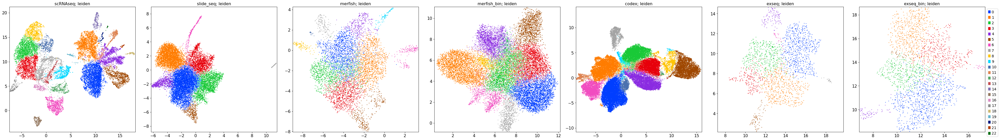

In [22]:
fig = tc.pl.scatter(adatas_combined_macro, keys=['leiden'],joint=True,position_key="X_umap",axsize=(6,6), share_scaling=False, padding=0.75);
#fig.savefig(combined_dir+'/all_UMAP_sample.pdf',bbox_inches='tight')

/secure/projects/tacco/tacco/plots/_plots.py:872: RuntimeWarning: invalid value encountered in true_divide
  weights = weights / weights.sum(axis=-1)[...,None]


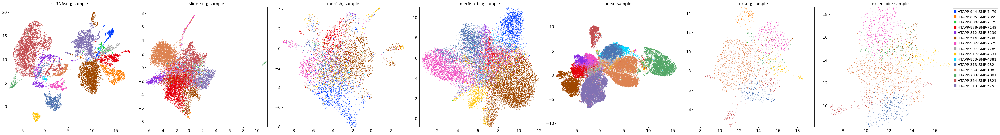

In [23]:
fig = tc.pl.scatter(adatas_combined_macro, keys=['sample'],joint=True,position_key="X_umap",axsize=(6,6), share_scaling=False, padding=0.75);
#fig.savefig(combined_dir+'/all_UMAP_sample.pdf',bbox_inches='tight')

/secure/projects/tacco/tacco/plots/_plots.py:872: RuntimeWarning: invalid value encountered in true_divide
  weights = weights / weights.sum(axis=-1)[...,None]


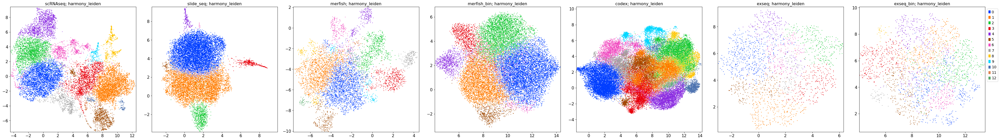

In [24]:
fig = tc.pl.scatter(adatas_combined_macro, keys=['harmony_leiden'],joint=True,position_key="harmony_X_umap",axsize=(6,6), share_scaling=False, padding=0.75);
#fig.savefig(combined_dir+'/all_UMAP_sample.pdf',bbox_inches='tight')

/secure/projects/tacco/tacco/plots/_plots.py:872: RuntimeWarning: invalid value encountered in true_divide
  weights = weights / weights.sum(axis=-1)[...,None]


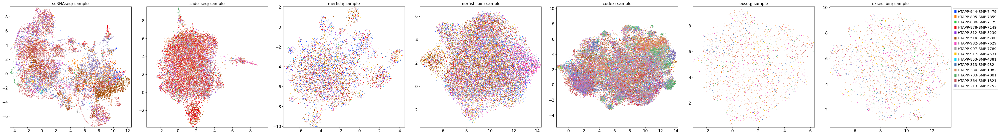

In [25]:
fig = tc.pl.scatter(adatas_combined_macro, keys=['sample'],joint=True,position_key="harmony_X_umap",axsize=(6,6), share_scaling=False, padding=0.75);
#fig.savefig(combined_dir+'/all_UMAP_sample.pdf',bbox_inches='tight')

In [ ]:
fig = tc.pl.scatter(adatas_combined_macro['scRNAseq'], keys=['method'],joint=True,position_key="harmony_X_umap",axsize=(3,3), share_scaling=False, padding=0.75);
#fig.savefig(combined_dir+'/all_UMAP_sample.pdf',bbox_inches='tight')

In [ ]:
fig = tc.pl.scatter(adatas_combined_macro['scRNAseq'], keys=['method'],joint=True,position_key="X_umap",axsize=(3,3), share_scaling=False, padding=0.75);
#fig.savefig(combined_dir+'/all_UMAP_sample.pdf',bbox_inches='tight')

In [ ]:
plot_variable_grid_extended(adatas_combined_macro,methods=['scRNAseq','slide_seq','merfish','merfish_bin','exseq','exseq_bin','codex'],
                            variables=int_genes['Canonical MP markers'],basis='harmony_X_umap')

In [ ]:
plot_variable_grid_extended(adatas_combined_macro,methods=['scRNAseq','slide_seq','merfish','merfish_bin','exseq','exseq_bin','codex'],
                            variables=int_genes['Other CT markers'],basis='harmony_X_umap')

In [25]:
def make_de_hm(adata,groups='all',log2fc_min=1.5,store=False):
    sc.tl.rank_genes_groups(adata, 'harmony_leiden',groups=groups, method='wilcoxon')
    sc.pl.rank_genes_groups(adata, sharey=False)
    diff_df=sc.get.rank_genes_groups_df(adata,group=None,log2fc_min=log2fc_min,pval_cutoff=0.05).sort_values(['group','pvals_adj']).groupby('group').head(5)
    var={k:v for k,v in (diff_df.groupby('group')['names'])if len(v)>0}
    mp=sc.pl.MatrixPlot(adata[adata.obs['harmony_leiden'].isin(diff_df['group'].unique())],groupby='harmony_leiden',var_names=var,standard_scale='var')
    mp.add_totals(color='black').show()
    if store:
        return mp

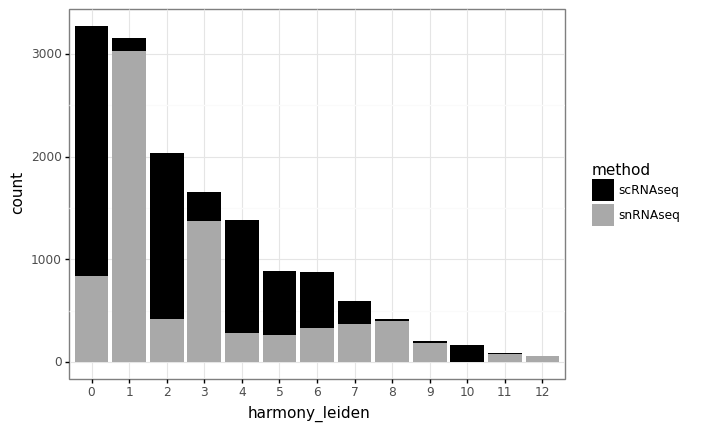

<ggplot: (2948365535450)>

In [32]:
pl.ggplot(adatas_combined_macro['scRNAseq'].obs,pl.aes(x='harmony_leiden',fill='method'))+pl.geom_bar(stat='count')+pl.scale_fill_manual(
{"scRNAseq":"black","snRNAseq":"darkgrey"})+pl.theme_bw()

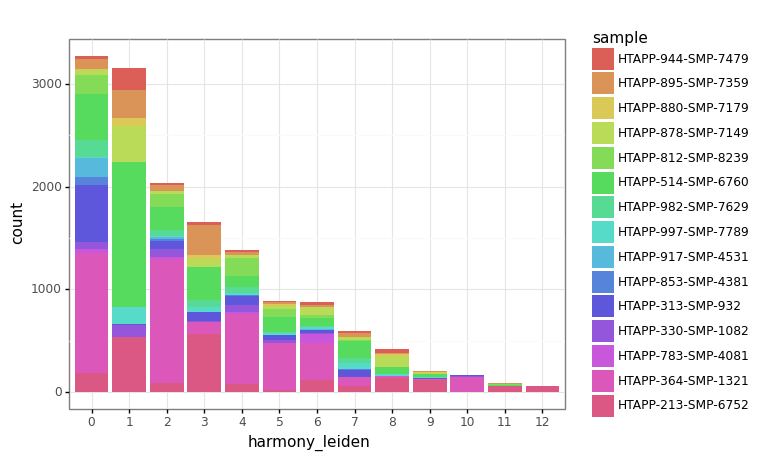

<ggplot: (-9223369088489172378)>

In [33]:
pl.ggplot(adatas_combined_macro['scRNAseq'].obs,pl.aes(x='harmony_leiden',fill='sample'))+pl.geom_bar(stat='count')+pl.theme_bw()

In [34]:
adata_sc=adatas_combined_macro['scRNAseq'][adatas_combined_macro['scRNAseq'].obs['method']=='scRNAseq'].copy()
adata_sn=adatas_combined_macro['scRNAseq'][adatas_combined_macro['scRNAseq'].obs['method']=='snRNAseq'].copy()

In [ ]:
dp=sc.pl.dotplot(adatas_combined_macro['codex'],var_names=codex_genes,groupby=['harmony_leiden'],standard_scale='var',dendrogram=True,return_fig=True)
dp.add_totals().style(dot_edge_color='black', dot_edge_lw=0.5).show()

In [ ]:
dp=sc.pl.dotplot(adatas_combined_macro['exseq_bin'],var_names=em_genes,groupby=['harmony_leiden'],dendrogram=True,return_fig=True)
dp.add_totals().style(dot_edge_color='black', dot_edge_lw=0.5).show()

In [ ]:
dp=sc.pl.dotplot(adatas_combined_macro['exseq'],var_names=em_genes,groupby=['harmony_leiden'],dendrogram=True,return_fig=True)
dp.add_totals().style(dot_edge_color='black', dot_edge_lw=0.5).show()

In [ ]:
dp=sc.pl.dotplot(adatas_combined_macro['merfish_bin'],var_names=em_genes,groupby=['harmony_leiden'],dendrogram=True,return_fig=True)
dp.add_totals().style(dot_edge_color='black', dot_edge_lw=0.5).show()

In [ ]:
dp=sc.pl.dotplot(adatas_combined_macro['merfish'],var_names=em_genes,groupby=['harmony_leiden'],dendrogram=True,return_fig=True)
dp.add_totals().style(dot_edge_color='black', dot_edge_lw=0.5).show()

In [ ]:
dp=sc.pl.dotplot(adatas_combined_macro['slide_seq'],var_names=int_genes,groupby=['harmony_leiden'],dendrogram=True,return_fig=True)
dp.add_totals().style(dot_edge_color='black', dot_edge_lw=0.5).show()

In [ ]:
dp=sc.pl.dotplot(adata_sn,var_names=int_genes,groupby=['harmony_leiden'],dendrogram=True,return_fig=True)
dp.add_totals().style(dot_edge_color='black', dot_edge_lw=0.5).show()

In [ ]:
dp=sc.pl.dotplot(adata_sc,var_names=int_genes,groupby=['harmony_leiden'],dendrogram=True,return_fig=True)
dp.add_totals().style(dot_edge_color='black', dot_edge_lw=0.5).show()

### Remove "contaminated" clusters and reprocess

In [240]:
remove_clusters={'scRNAseq':['6','8','9','11'],'snRNAseq':['6'],'slide_seq':['2','3','4'],'merfish':['2','3','4','5','7'],'merfish_bin':['1','3','4','5'],'exseq':['0','4'],'exseq_bin':['0','2','6'],'codex':['1','2','4','5','6','7','8','9','10','11','12']}

In [169]:
adatas_combined_macro_clean=pd.Series([[] for i in range(len(all_methods)+2)],index=['scnRNAseq','snRNAseq',*all_methods],dtype=object) 
#adatas_combined_macro_clean=adatas_combined_macro.copy()

for method in all_methods:
    print(method)
    if method=='scRNAseq':
        sub_tmp=adatas_combined_macro[method][((~adatas_combined_macro[method].obs["harmony_leiden"].isin(remove_clusters['scRNAseq']))&
                                                (adatas_combined_macro[method].obs["method"]=='scRNAseq'))|
                                                ((~adatas_combined_macro[method].obs["harmony_leiden"].isin(remove_clusters['snRNAseq']))&
                                                (adatas_combined_macro[method].obs["method"]=='snRNAseq'))].copy()
        for split_meth in ['scnRNAseq','scRNAseq','snRNAseq']:
            print(split_meth)
            if split_meth != 'scnRNAseq':
                sub=sub_tmp[sub_tmp.obs['method']==split_meth].copy()
                bk=None
            else:
                sub=sub_tmp.copy()
                bk='method'
            print('Assigning')
            adatas_combined_macro_clean[split_meth]=anndata.AnnData(X=sub.obsm["counts"],obsm=sub.obsm,obs=sub.obs,var=pd.DataFrame(index=sub.uns["counts_var"]))
            print('Processing')
            adatas_combined_macro_clean[split_meth]=create_scanpy(adatas_combined_macro_clean[[split_meth]],var_genes=None,batch_key=bk,redo=False,process=True,mode=None)
    else:
        sub=adatas_combined_macro[method][~adatas_combined_macro[method].obs["harmony_leiden"].isin(remove_clusters[method])].copy()
        adatas_combined_macro_clean[method]=anndata.AnnData(X=sub.obsm["counts"],obsm=sub.obsm,obs=sub.obs,var=pd.DataFrame(index=sub.uns["counts_var"]))
        adatas_combined_macro_clean[method]=create_scanpy(adatas_combined_macro_clean[[method]],var_genes=None,batch_key=None,redo=False,process=True,mode=None)

scRNAseq
scnRNAseq
Assigning
Processing
scRNAseq
Assigning
Processing
snRNAseq
Assigning
Processing
slide_seq
merfish
merfish_bin
codex


/secure/src/anaconda3/envs/scanpy/lib/python3.6/site-packages/scanpy/preprocessing/_highly_variable_genes.py:64: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.


exseq
exseq_bin


In [170]:
adatas_combined_macro_clean=do_harmony(adatas_combined_macro_clean,all_methods=['scnRNAseq','snRNAseq',*all_methods],resolution=0.6)

	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
	Completed 9 / 10 iteration(s).
	Completed 10 / 10 iteration(s).
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
	Completed 9 / 10 iteration(s).
	Completed 10 / 10 iteration(s).
Reach convergence after 10 iteration(s).
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Co

In [171]:
for method in ['scnRNAseq','snRNAseq',*all_methods]:
    adatas_combined_macro_clean[method].write(combined_dir+"/"+method+"_macro_clean.h5ad",compression="gzip")

In [23]:
adatas_combined_macro_clean=pd.Series([[] for i in range(len(all_methods)+2)],index=['scnRNAseq','snRNAseq',*all_methods],dtype=object) 
for method in ['scnRNAseq','snRNAseq',*all_methods]:
    adatas_combined_macro_clean[method]=sc.read(combined_dir+"/"+method+"_macro_clean.h5ad",compression="gzip")

/secure/projects/tacco/tacco/plots/_plots.py:872: RuntimeWarning: invalid value encountered in true_divide


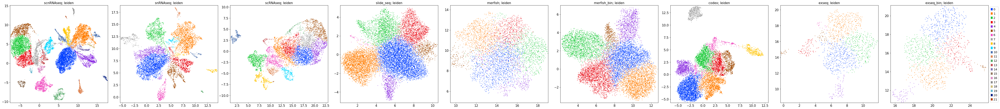

In [148]:
fig = tc.pl.scatter(adatas_combined_macro_clean, keys=['leiden'],joint=True,position_key="X_umap",axsize=(6,6), share_scaling=False, padding=0.75);
fig.savefig(combined_dir+'/mp_all_UMAP_noharm_cluster.pdf',bbox_inches='tight')

/secure/projects/tacco/tacco/plots/_plots.py:872: RuntimeWarning: invalid value encountered in true_divide


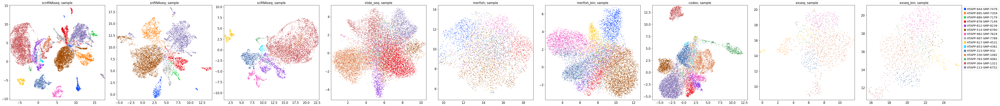

In [149]:
fig = tc.pl.scatter(adatas_combined_macro_clean, keys=['sample'],joint=True,position_key="X_umap",axsize=(6,6), share_scaling=False, padding=0.75);
fig.savefig(combined_dir+'/mp_all_UMAP_noharm_sample.pdf',bbox_inches='tight')

/secure/projects/tacco/tacco/plots/_plots.py:872: RuntimeWarning: invalid value encountered in true_divide


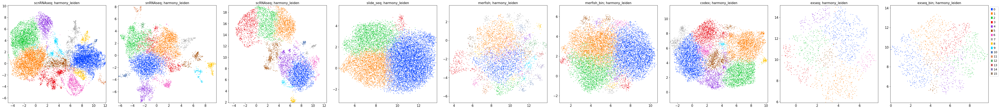

In [150]:
fig = tc.pl.scatter(adatas_combined_macro_clean, keys=['harmony_leiden'],joint=True,position_key="harmony_X_umap",axsize=(6,6), share_scaling=False, padding=0.75);
fig.savefig(combined_dir+'/mp_all_UMAP_harm_cluster.pdf',bbox_inches='tight')

/secure/projects/tacco/tacco/plots/_plots.py:872: RuntimeWarning: invalid value encountered in true_divide


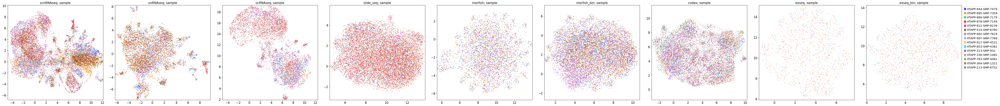

In [151]:
fig = tc.pl.scatter(adatas_combined_macro_clean, keys=['sample'],joint=True,position_key="harmony_X_umap",axsize=(6,6), share_scaling=False, padding=0.75);
fig.savefig(combined_dir+'/mp_all_UMAP_harm_sample.pdf',bbox_inches='tight')

In [ ]:
fig = tc.pl.scatter(adatas_combined_macro_clean['scnRNAseq'], keys=['method'],joint=True,position_key="harmony_X_umap",axsize=(3,3), share_scaling=False, padding=0.75);
fig.savefig(combined_dir+'/mp_sc_sn_UMAP_harm.pdf',bbox_inches='tight')

In [ ]:
fig = tc.pl.scatter(adatas_combined_macro_clean['scnRNAseq'], keys=['method'],joint=True,position_key="X_umap",axsize=(3,3), share_scaling=False, padding=0.75);
fig.savefig(combined_dir+'/mp_sc_sn_UMAP_noharm.pdf',bbox_inches='tight')

In [ ]:
fig=plot_variable_grid_extended(adatas_combined_macro_clean,methods=adatas_combined_macro_clean.index,
                            variables=[*int_genes['Canonical MP markers'],'ITGAX','APOE','LYZ','ISG15'],basis='harmony_X_umap')
fig.savefig(combined_dir+'/mp_all_UMAP_harm_markers.pdf',bbox_inches='tight')

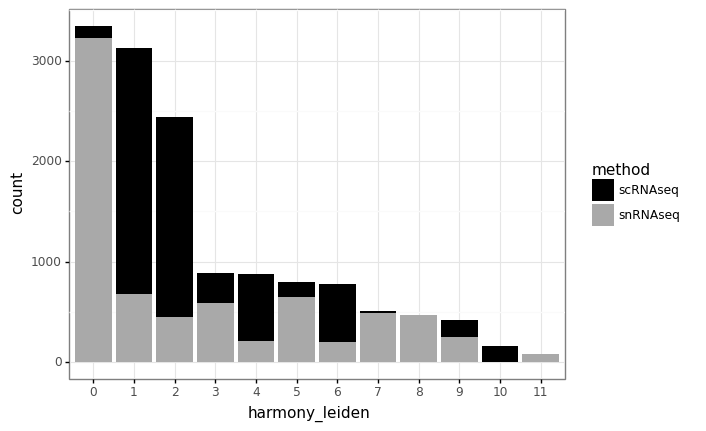

<ggplot: (2948888531506)>

In [181]:
pl.ggplot(adatas_combined_macro_clean['scnRNAseq'].obs,pl.aes(x='harmony_leiden',fill='method'))+pl.geom_bar(stat='count')+pl.scale_fill_manual(
{"scRNAseq":"black","snRNAseq":"darkgrey"})+pl.theme_bw()

In [99]:
adata_sc=adatas_combined_macro_clean['scnRNAseq'][adatas_combined_macro_clean['scnRNAseq'].obs['method']=='scRNAseq'].copy()
adata_sn=adatas_combined_macro_clean['scnRNAseq'][adatas_combined_macro_clean['scnRNAseq'].obs['method']=='snRNAseq'].copy()

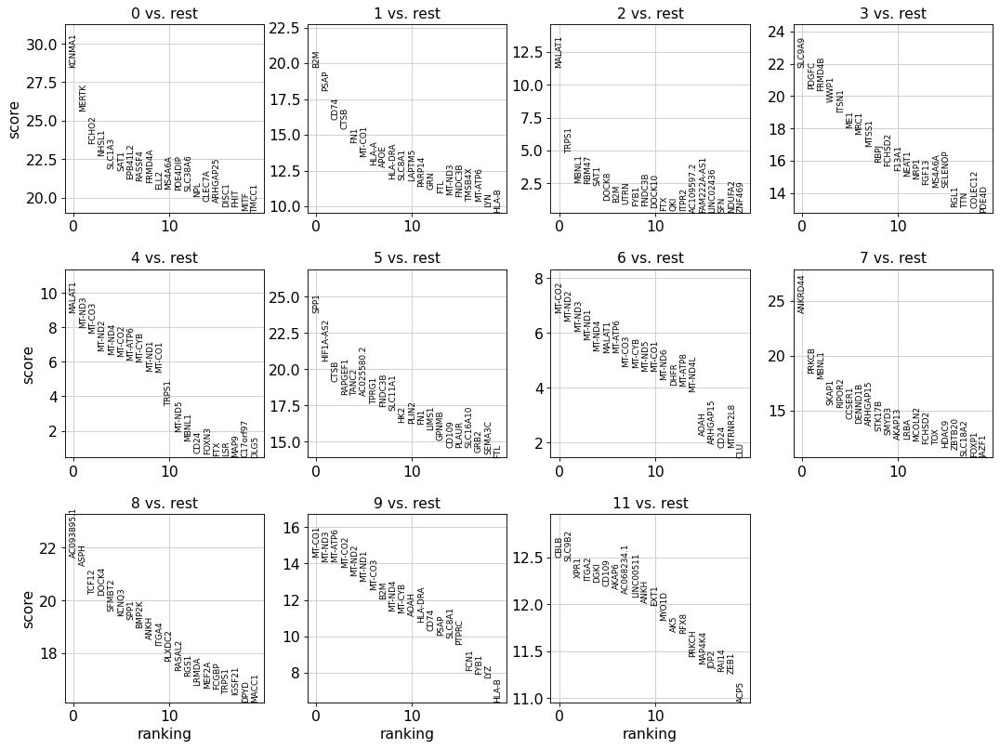

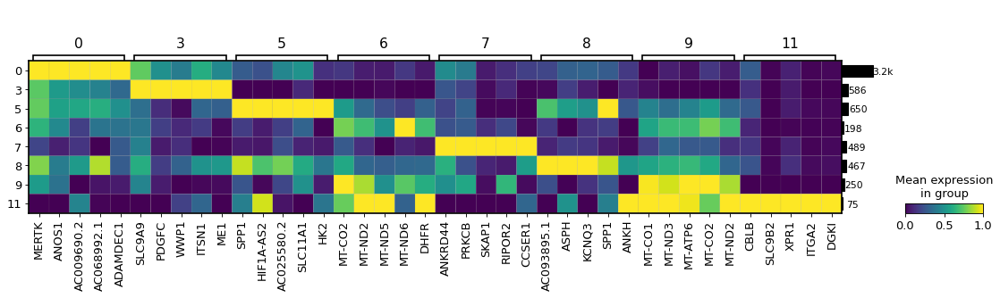

In [183]:
make_de_hm(adata_sn)

In [158]:
sn_de=['MERTK','SLC9A9','SPP1','HIF1A-AS2','MT-ND6','ANKRD44','SKAP1','KCNQ3','CBLB','ITGA2']

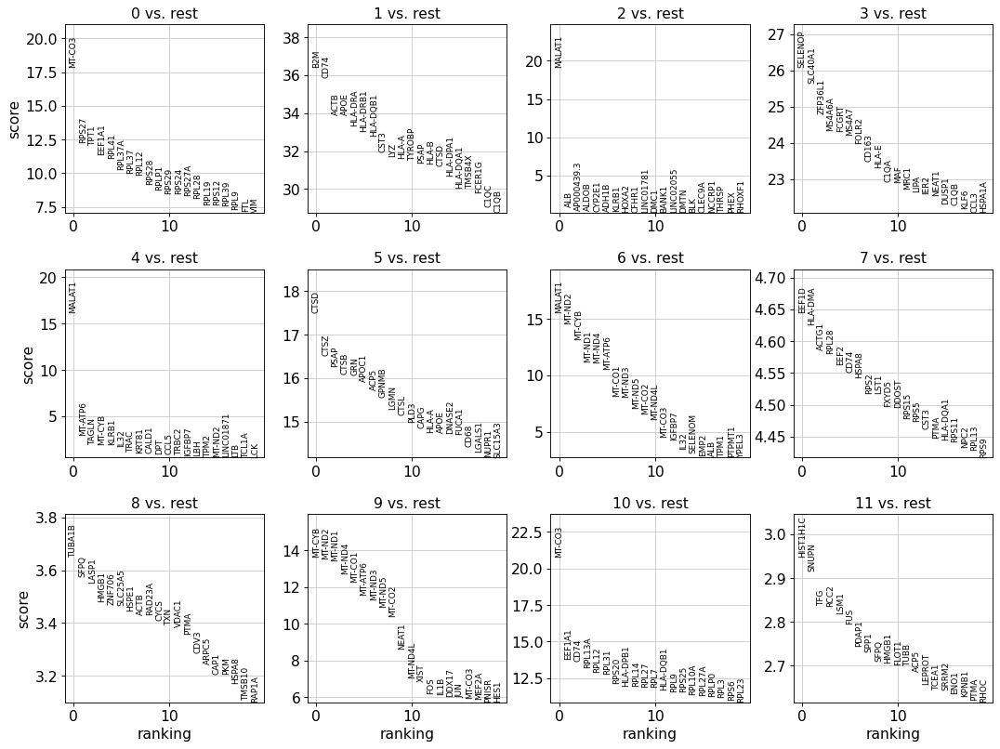

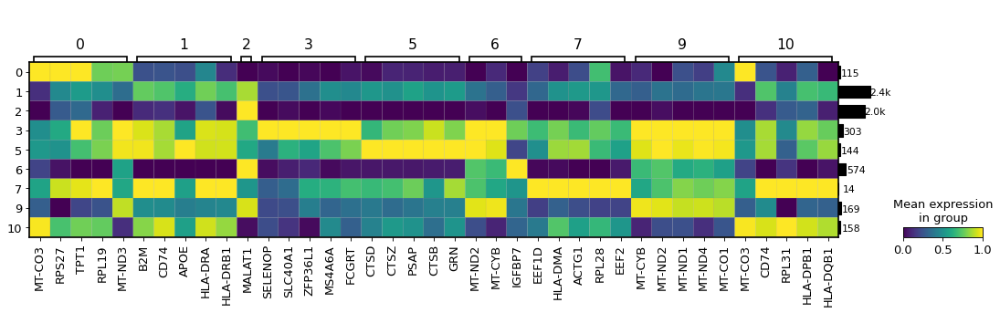

In [185]:
make_de_hm(adata_sc.copy())

In [159]:
sc_de=['RPS27','TPT1','HLA-DRB1','MS4A6A','CTSD','IGFBP7','HLA-DMA','MT-CYB','RPL31']

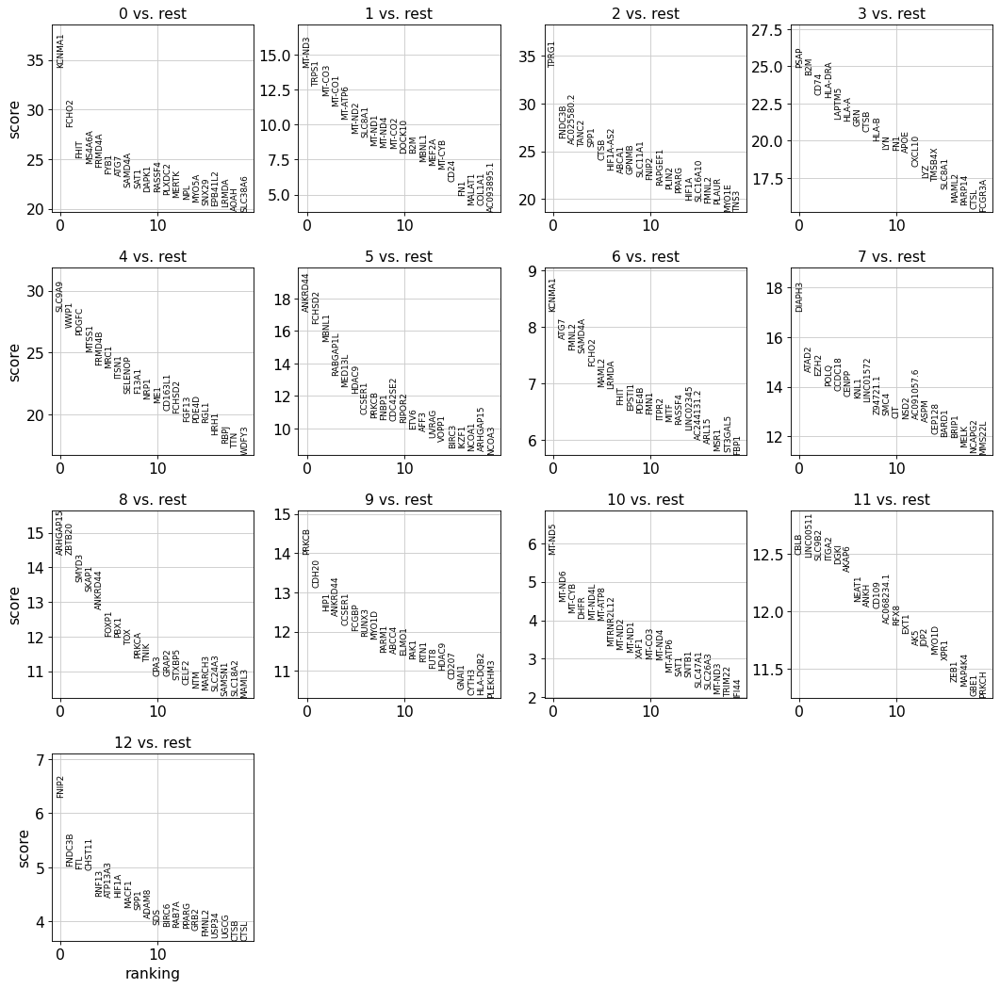

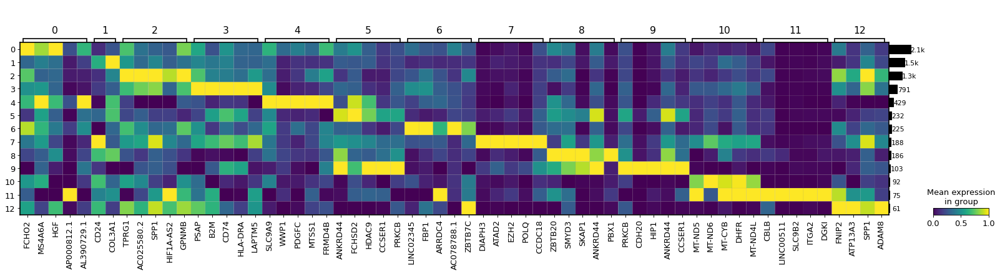

In [188]:
make_de_hm(adatas_combined_macro_clean['snRNAseq'])

In [160]:
ssn_de=['FCHO2','COL3A1','TPRG1','PSAP','WWP1','FCHSD2','FBP1','EZH2','PBX1','CDH20','DHFR','ITGA2','ADAM8']

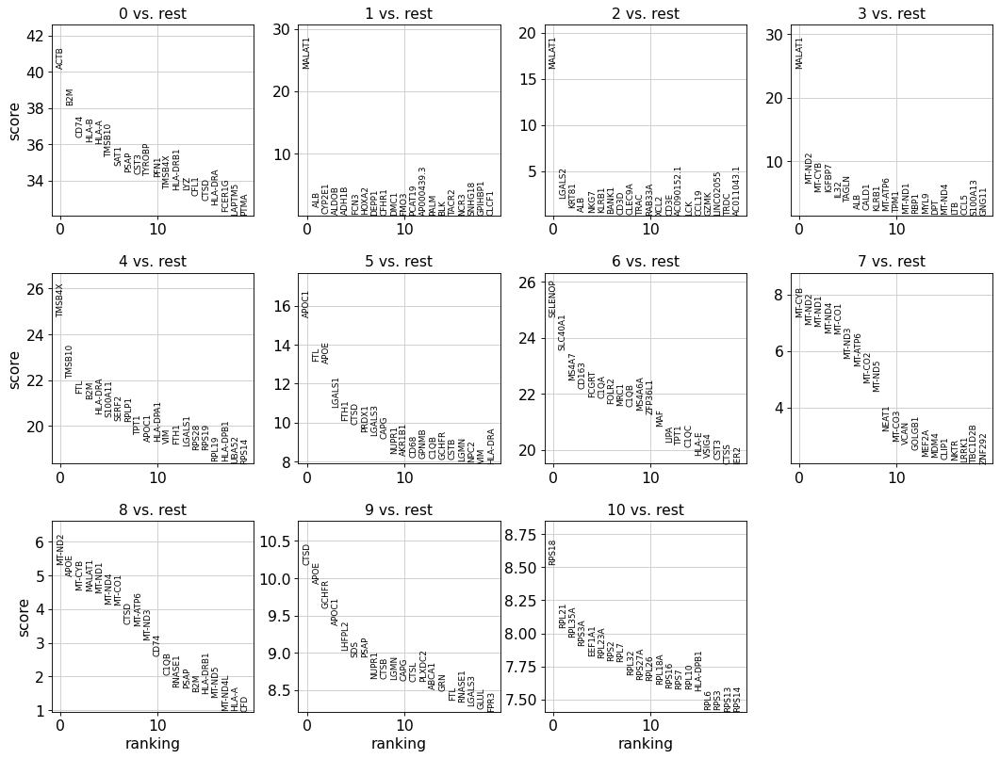

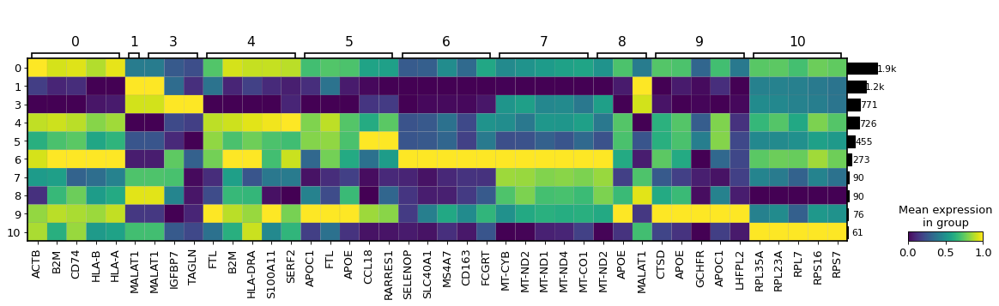

In [187]:
make_de_hm(adatas_combined_macro_clean['scRNAseq'])

In [161]:
ssc_de=['ACTB','MALAT1','IGFBP7','SERF2','CCL18','SELENOP','MS4A7','CTSD','RPL35A']

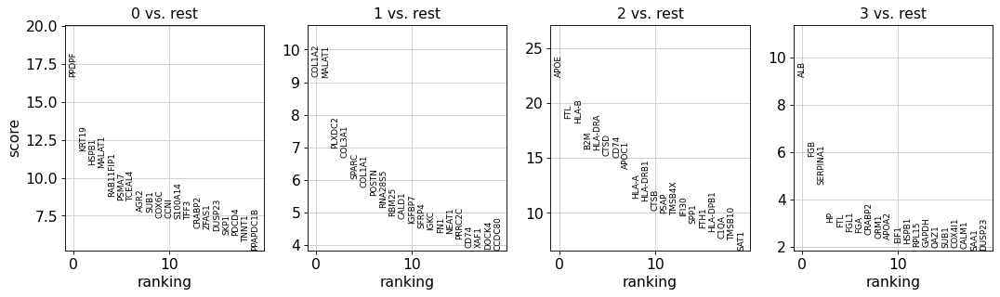

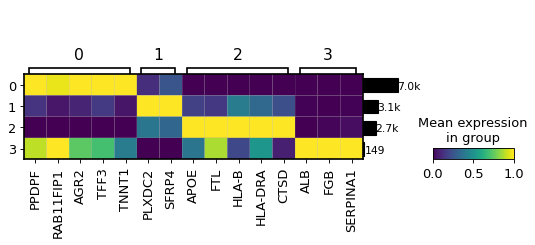

In [91]:
make_de_hm(adatas_combined_macro_clean['slide_seq'])

In [162]:
s_de=['PPDPF','PLXDC2','CTSD','SERPINA1']

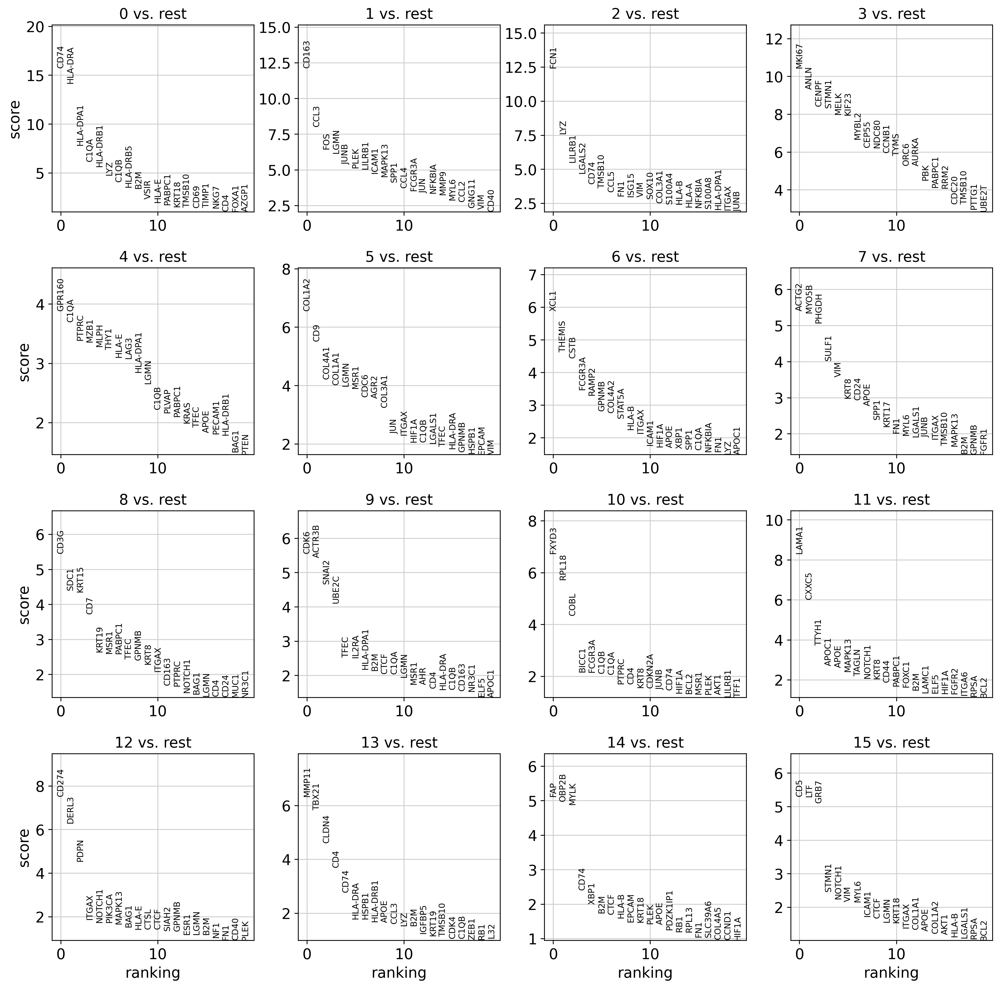

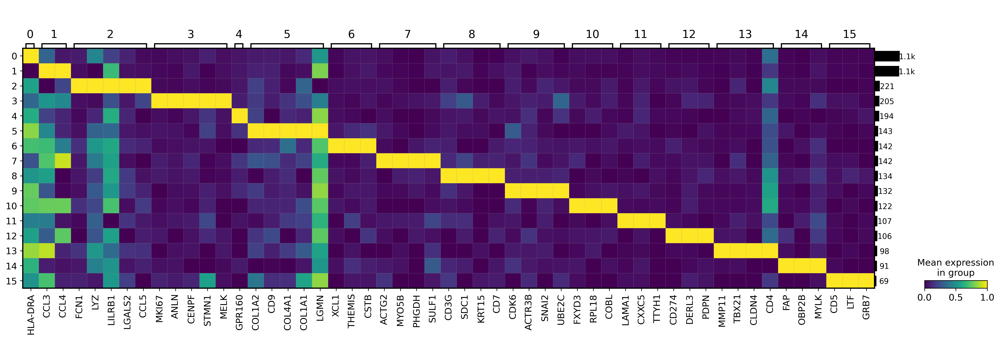

In [26]:
plots=make_de_hm(adatas_combined_macro_clean['merfish'],store=True)

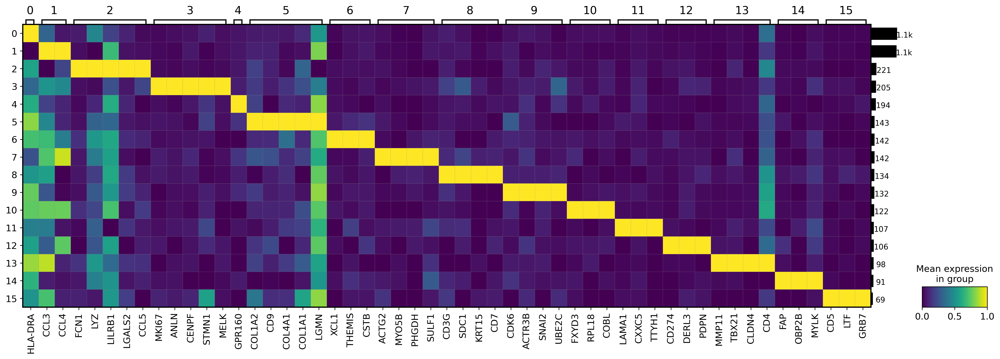

In [29]:
plots.savefig(combined_dir+'/mp_merfish_hm_harm.pdf',bbox_inches='tight')

In [163]:
m_de=['HLA-DRA','CCL4','FCN1','ANLN','GPR160','CD9','XCL1','SULF1','SDC1','CDK6','FXYD3','CXXC5','CD274','MMP11','FAP','CD5']

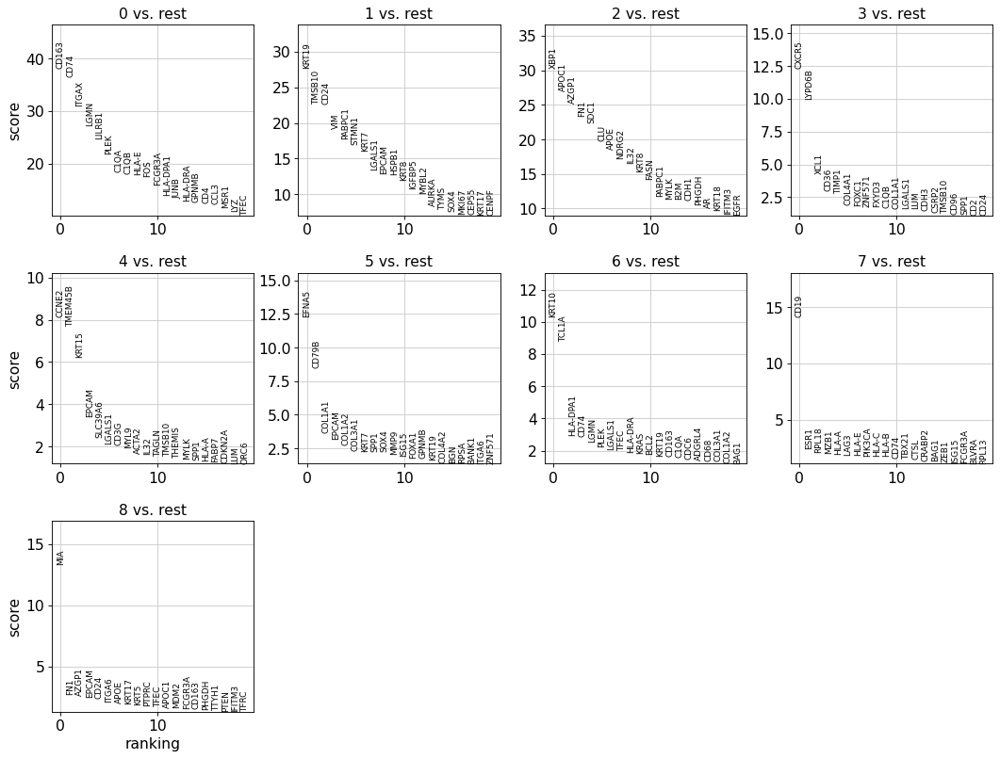

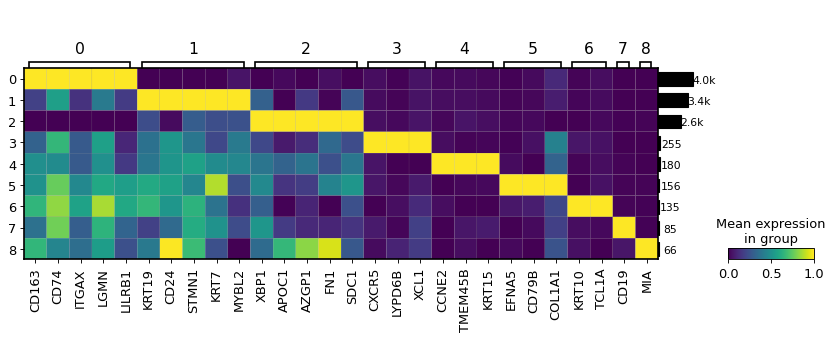

In [70]:
make_de_hm(adatas_combined_macro_clean['merfish_bin'])

In [164]:
mb_de=['CD163','MYBL2','XBP1','SDC1','CXCR5','CCNE2','EFNA5','TCL1A','CD19','MIA']

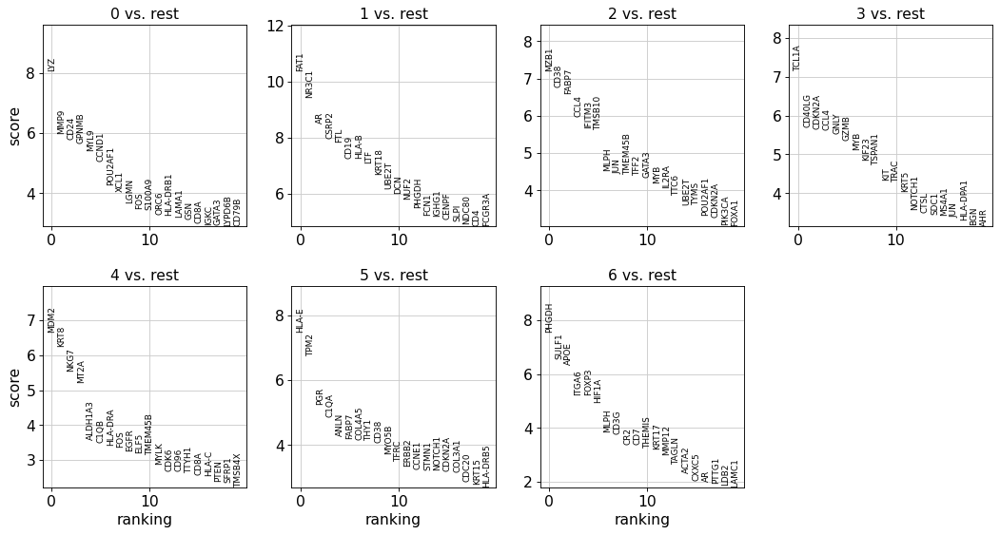

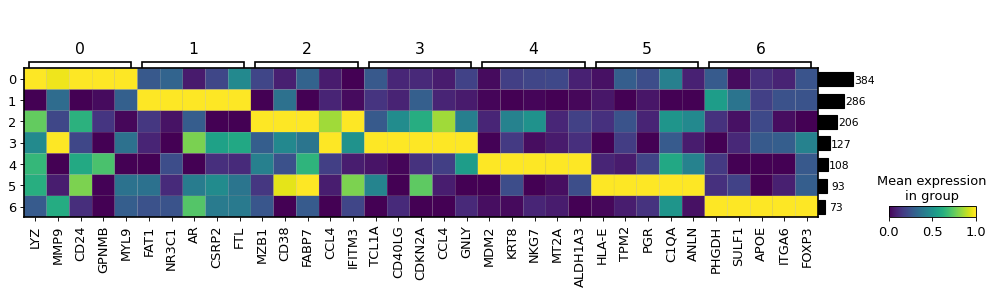

In [37]:
make_de_hm(adatas_combined_macro_clean['exseq'])

In [165]:
e_de=['GPNMB','FAT1','IFITM3','CD40LG','MDM2','HLA-E','ITGA6']

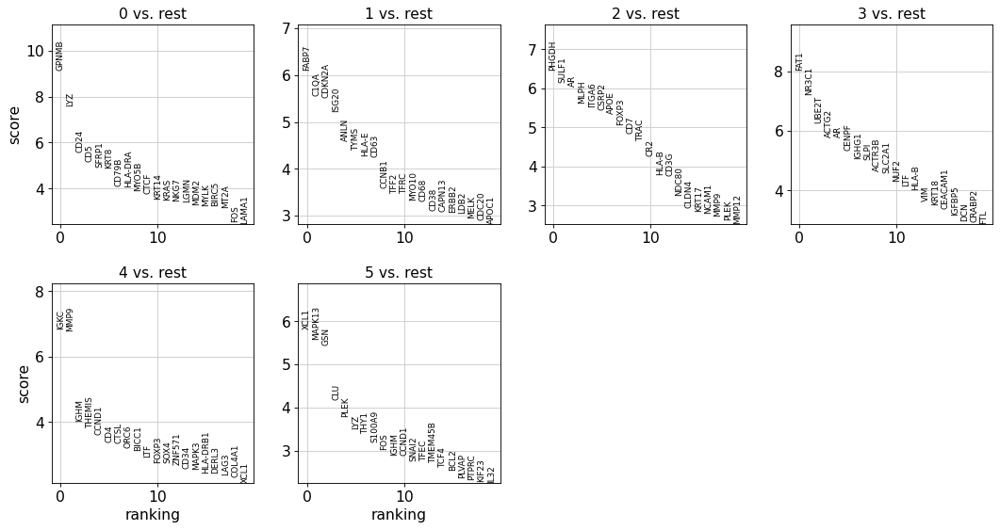

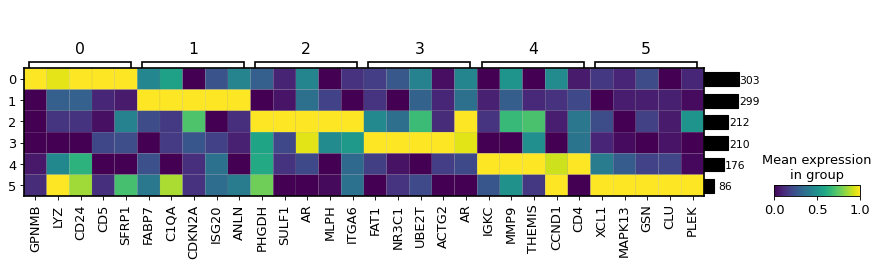

In [40]:
make_de_hm(adatas_combined_macro_clean['exseq_bin'])

In [166]:
eb_de=['GPNMB','CD5','FABP7','ISG20','ANLN','SULF1','FAT1','MMP9','XCL1']

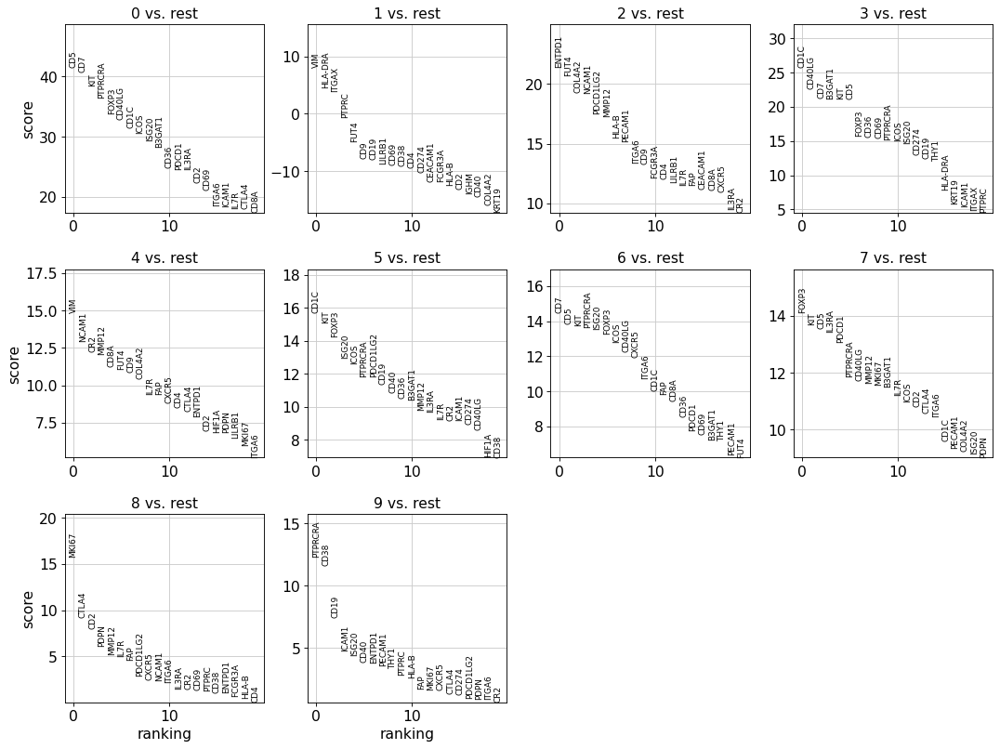

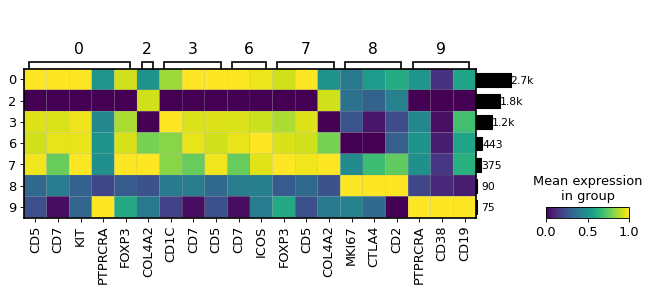

In [73]:
make_de_hm(adatas_combined_macro_clean['codex'])

In [167]:
co_de=['CD5','VIM','CD1C','CD7','ISG20','FOXP3','PTPRCRA']

In [170]:
subtype_genes={'Cycling':['MKI67','CENPF'],'LAM1':['FABP5'],'LAM2':['APOE'],'MP1':['EGR1'],'MP2':['CXCL10'],'MP3':['SIGLEC1']}

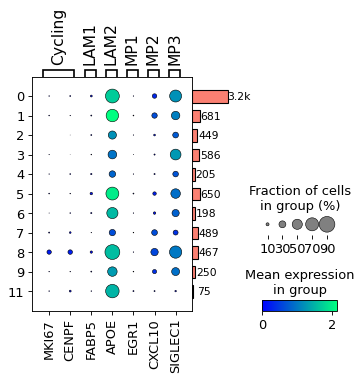

In [139]:
dp=sc.pl.dotplot(adata_sn,var_names=subtype_genes,groupby=['harmony_leiden'],dendrogram=False,return_fig=True)
dp.add_totals().style(dot_edge_color='black', dot_edge_lw=0.5).show()

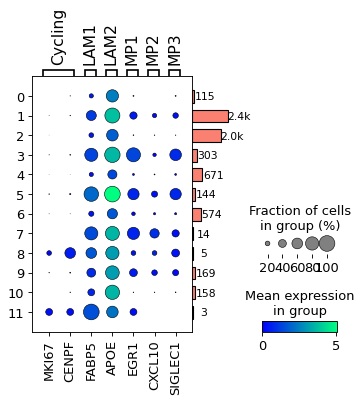

In [140]:
dp=sc.pl.dotplot(adata_sc,var_names=subtype_genes,groupby=['harmony_leiden'],dendrogram=False,return_fig=True)
dp.add_totals().style(dot_edge_color='black', dot_edge_lw=0.5).show()

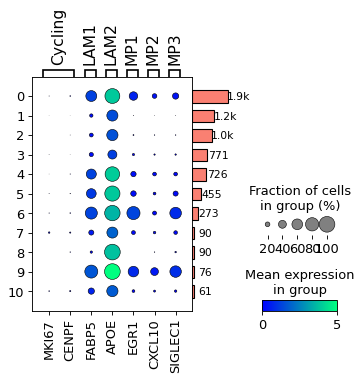

In [141]:
dp=sc.pl.dotplot(adatas_combined_macro_clean['scRNAseq'],var_names=subtype_genes,groupby=['harmony_leiden'],dendrogram=False,return_fig=True)
dp.add_totals().style(dot_edge_color='black', dot_edge_lw=0.5).show()

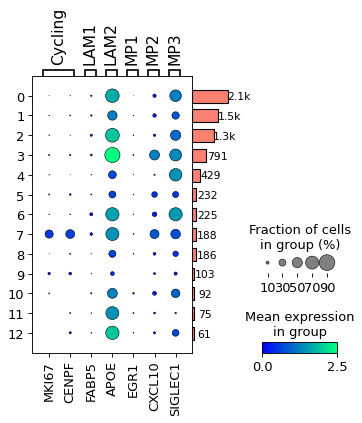

In [142]:
dp=sc.pl.dotplot(adatas_combined_macro_clean['snRNAseq'],var_names=subtype_genes,groupby=['harmony_leiden'],dendrogram=False,return_fig=True)
dp.add_totals().style(dot_edge_color='black', dot_edge_lw=0.5).show()

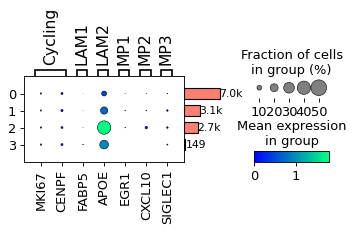

In [143]:
dp=sc.pl.dotplot(adatas_combined_macro_clean['slide_seq'],var_names=subtype_genes,groupby=['harmony_leiden'],dendrogram=False,return_fig=True)
dp.add_totals().style(dot_edge_color='black', dot_edge_lw=0.5).show()

In [168]:
int_co=codex_genes.copy()
int_co['DE']=co_de

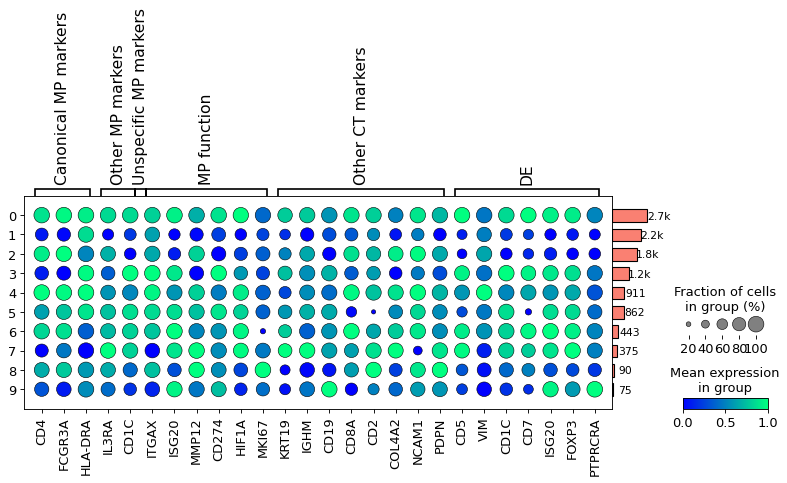

In [174]:
dp=sc.pl.dotplot(adatas_combined_macro_clean['codex'],var_names=int_co,groupby=['harmony_leiden'],standard_scale='var',dendrogram=False,return_fig=True)
dp.add_totals().style(dot_edge_color='black', dot_edge_lw=0.5)
dp.savefig(combined_dir+'/mp_codex_dp_harm.pdf',bbox_inches='tight');

In [175]:
int_eb=em_genes.copy()
int_eb['DE']=eb_de

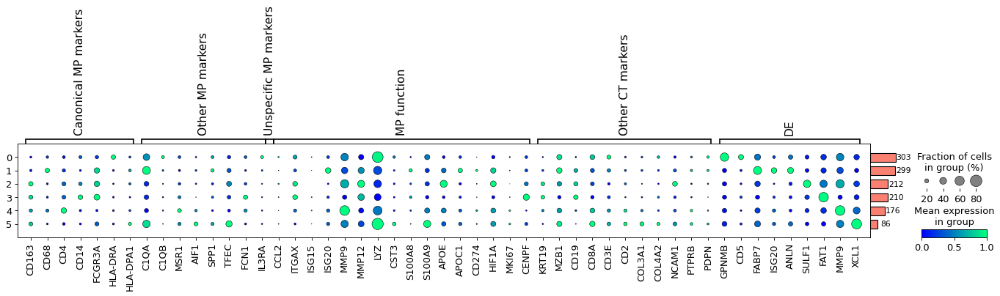

In [177]:
dp=sc.pl.dotplot(adatas_combined_macro_clean['exseq_bin'],var_names=int_eb,groupby=['harmony_leiden'],standard_scale='var',dendrogram=False,return_fig=True)
dp.add_totals().style(dot_edge_color='black', dot_edge_lw=0.5)
dp.savefig(combined_dir+'/mp_exseq_bin_dp_harm.pdf',bbox_inches='tight');

In [178]:
int_e=em_genes.copy()
int_e['DE']=e_de

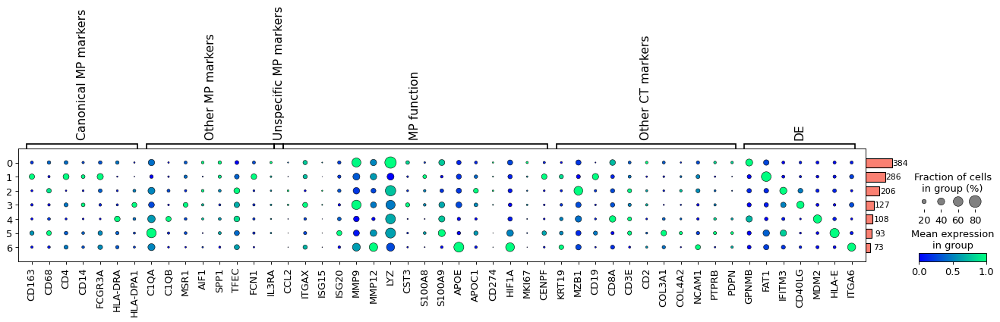

In [179]:
dp=sc.pl.dotplot(adatas_combined_macro_clean['exseq'],var_names=int_e,groupby=['harmony_leiden'],standard_scale='var',dendrogram=False,return_fig=True)
dp.add_totals().style(dot_edge_color='black', dot_edge_lw=0.5)
dp.savefig(combined_dir+'/mp_exseq_dp_harm.pdf',bbox_inches='tight');

In [180]:
int_mb=em_genes.copy()
int_mb['DE']=mb_de

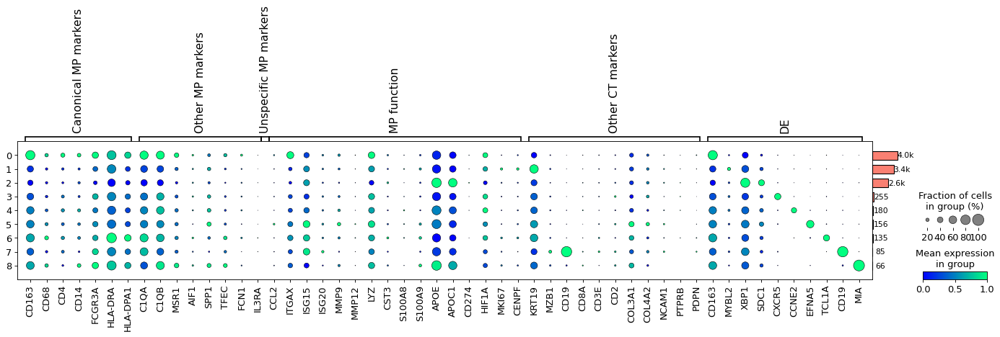

In [181]:
dp=sc.pl.dotplot(adatas_combined_macro_clean['merfish_bin'],var_names=int_mb,groupby=['harmony_leiden'],standard_scale='var',dendrogram=False,return_fig=True)
dp.add_totals().style(dot_edge_color='black', dot_edge_lw=0.5)
dp.savefig(combined_dir+'/mp_merfish_bin_dp_harm.pdf',bbox_inches='tight');

In [182]:
int_m=em_genes.copy()
int_m['DE']=m_de

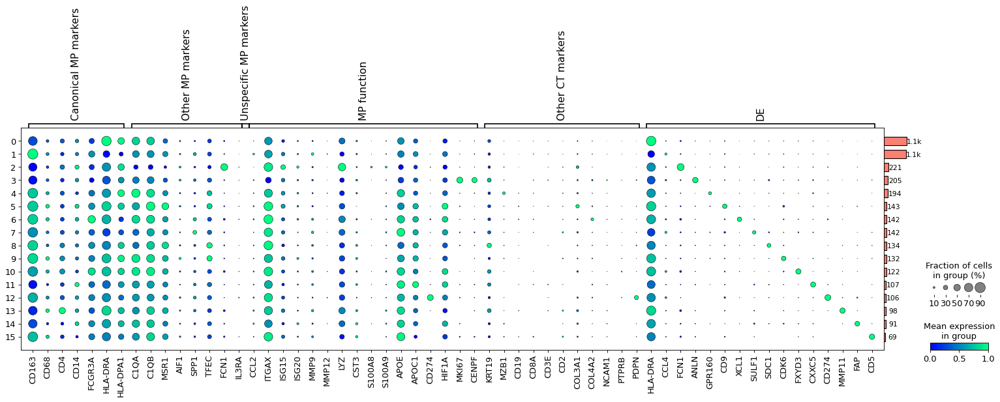

In [183]:
dp=sc.pl.dotplot(adatas_combined_macro_clean['merfish'],var_names=int_m,groupby=['harmony_leiden'],standard_scale='var',dendrogram=False,return_fig=True)
dp.add_totals().style(dot_edge_color='black', dot_edge_lw=0.5)
dp.savefig(combined_dir+'/mp_merfish_dp_harm.pdf',bbox_inches='tight');

In [184]:
int_s=int_genes.copy()
int_s['DE']=s_de

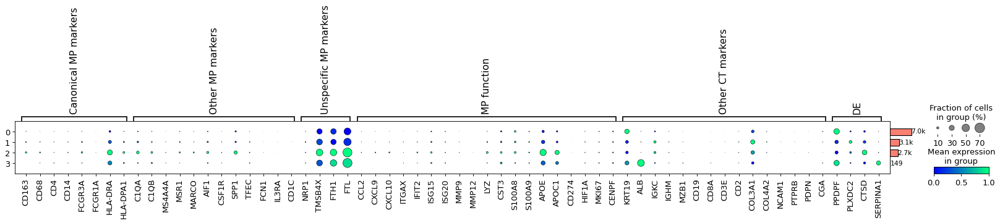

In [185]:
dp=sc.pl.dotplot(adatas_combined_macro_clean['slide_seq'],var_names=int_s,groupby=['harmony_leiden'],standard_scale='var',dendrogram=False,return_fig=True)
dp.add_totals().style(dot_edge_color='black', dot_edge_lw=0.5)
dp.savefig(combined_dir+'/mp_slide_seq_bin_dp_harm.pdf',bbox_inches='tight');

In [186]:
int_ssn=int_genes.copy()
int_ssn['DE']=ssn_de

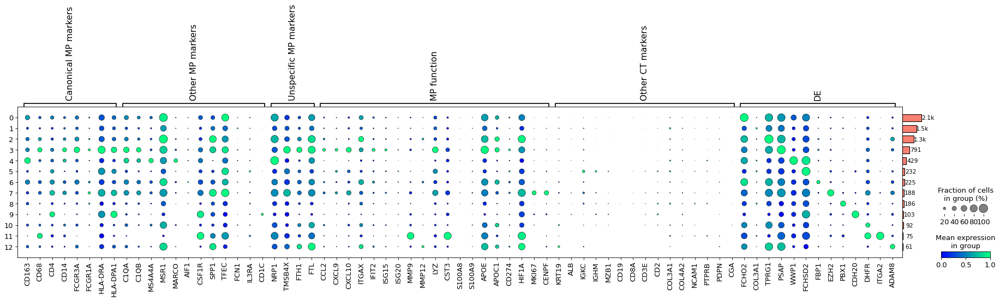

In [187]:
dp=sc.pl.dotplot(adatas_combined_macro_clean['snRNAseq'],var_names=int_ssn,groupby=['harmony_leiden'],standard_scale='var',dendrogram=False,return_fig=True)
dp.add_totals().style(dot_edge_color='black', dot_edge_lw=0.5)
dp.savefig(combined_dir+'/mp_snRNAseq_dp_harm.pdf',bbox_inches='tight');

In [188]:
int_ssc=int_genes.copy()
int_ssc['DE']=ssc_de

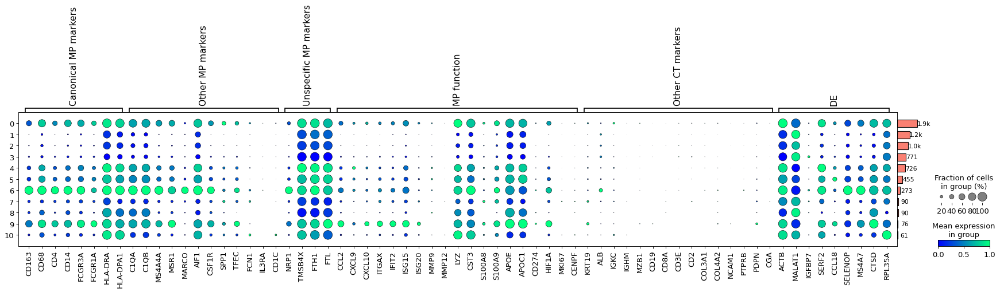

In [189]:
dp=sc.pl.dotplot(adatas_combined_macro_clean['scRNAseq'],var_names=int_ssc,groupby=['harmony_leiden'],standard_scale='var',dendrogram=False,return_fig=True)
dp.add_totals().style(dot_edge_color='black', dot_edge_lw=0.5)
dp.savefig(combined_dir+'/mp_cRNAseq_dp_harm.pdf',bbox_inches='tight');

In [55]:
int_sn=int_genes.copy()
int_sn['DE']=sn_de

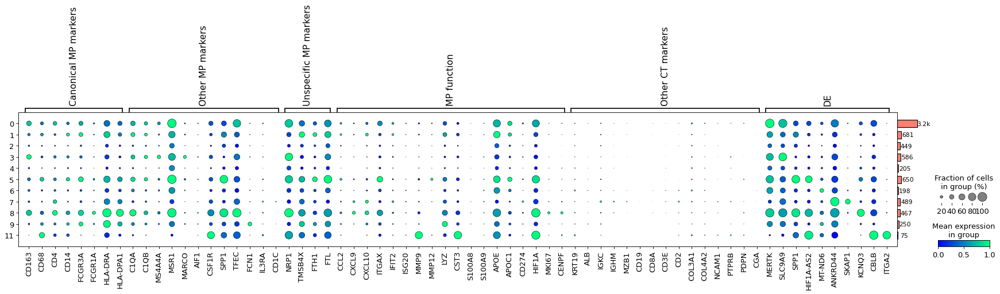

In [58]:
dp=sc.pl.dotplot(adata_sn,var_names=int_sn,groupby=['harmony_leiden'],standard_scale='var',dendrogram=False,return_fig=True)
dp.add_totals().style(dot_edge_color='black', dot_edge_lw=0.5).show()

In [66]:
int_sc=int_genes.copy()
int_sc['DE']=sc_de

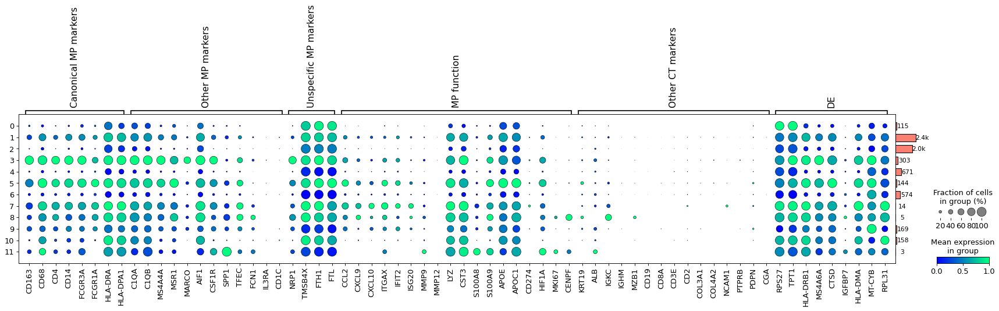

In [67]:
dp=sc.pl.dotplot(adata_sc,var_names=int_sc,groupby=['harmony_leiden'],standard_scale='var',dendrogram=False,return_fig=True)
dp.add_totals().style(dot_edge_color='black', dot_edge_lw=0.5).show()

### % marker gene expressing cells

In [56]:
def get_percent_expressing(adata,gene,threshold,sc_mode=False):
    if sc_mode:
        expr_df_mf=sc.get.obs_df(adata,keys=[gene,'sample'],use_raw=True)
        df=expr_df_mf.groupby(['sample'])[[gene]].apply(lambda x: (x>threshold).mean())
        hist=pl.ggplot(expr_df_mf,pl.aes(x=gene))+pl.geom_histogram()+pl.facet_wrap('sample')
    else:
        expr_df_mf=sc.get.obs_df(adata,keys=[gene,'sample','replicate','x', 'y'],use_raw=True)
        expr_df_mf['sample_repl']=expr_df_mf['sample'].astype('str')+expr_df_mf['replicate'].astype('str')
        df=expr_df_mf.groupby(['sample_repl'])[[gene]].apply(lambda x: (x>threshold).mean())
        hist=pl.ggplot(expr_df_mf,pl.aes(x=gene))+pl.geom_histogram()+pl.facet_wrap('sample_repl')
    return df,hist

/secure/src/anaconda3/envs/scanpy/lib/python3.6/site-packages/plotnine/stats/stat_bin.py:93: PlotnineWarning: 'stat_bin()' using 'bins = 12'. Pick better value with 'binwidth'.


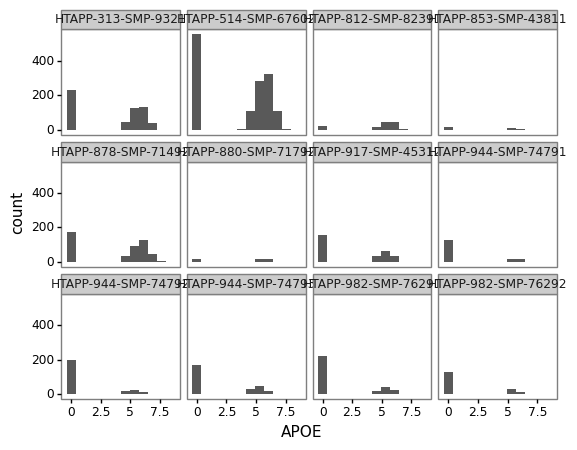

(                         APOE
 sample_repl                  
 HTAPP-313-SMP-9321   0.601399
 HTAPP-514-SMP-67602  0.603015
 HTAPP-812-SMP-82391  0.852113
 HTAPP-853-SMP-43811  0.500000
 HTAPP-878-SMP-71492  0.639241
 HTAPP-880-SMP-71792  0.690909
 HTAPP-917-SMP-45312  0.472603
 HTAPP-944-SMP-74791  0.239766
 HTAPP-944-SMP-74792  0.230469
 HTAPP-944-SMP-74793  0.371747
 HTAPP-982-SMP-76291  0.285246
 HTAPP-982-SMP-76292  0.271676,
 <ggplot: (-9223369077937956131)>)

In [168]:
get_percent_expressing(adatas_combined_macro_clean['merfish'],'APOE',0)

/secure/src/anaconda3/envs/scanpy/lib/python3.6/site-packages/plotnine/stats/stat_bin.py:93: PlotnineWarning: 'stat_bin()' using 'bins = 35'. Pick better value with 'binwidth'.


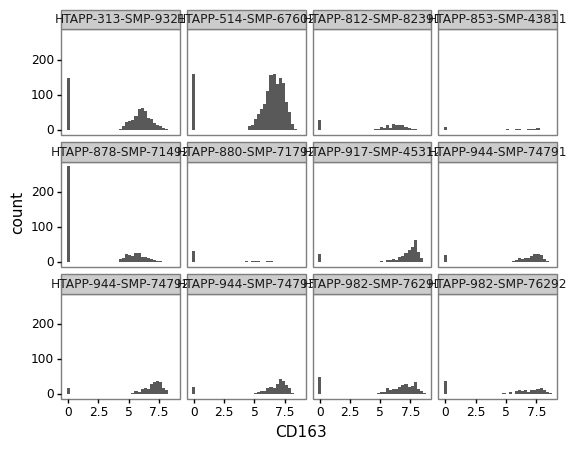

(                        CD163
 sample_repl                  
 HTAPP-313-SMP-9321   0.739510
 HTAPP-514-SMP-67602  0.885858
 HTAPP-812-SMP-82391  0.809859
 HTAPP-853-SMP-43811  0.750000
 HTAPP-878-SMP-71492  0.421941
 HTAPP-880-SMP-71792  0.418182
 HTAPP-917-SMP-45312  0.921233
 HTAPP-944-SMP-74791  0.888889
 HTAPP-944-SMP-74792  0.925781
 HTAPP-944-SMP-74793  0.925651
 HTAPP-982-SMP-76291  0.842623
 HTAPP-982-SMP-76292  0.786127,
 <ggplot: (-9223369078109965287)>)

In [57]:
get_percent_expressing(adatas_combined_macro_clean['merfish'],'CD163',0)

/secure/src/anaconda3/envs/scanpy/lib/python3.6/site-packages/plotnine/stats/stat_bin.py:93: PlotnineWarning: 'stat_bin()' using 'bins = 48'. Pick better value with 'binwidth'.


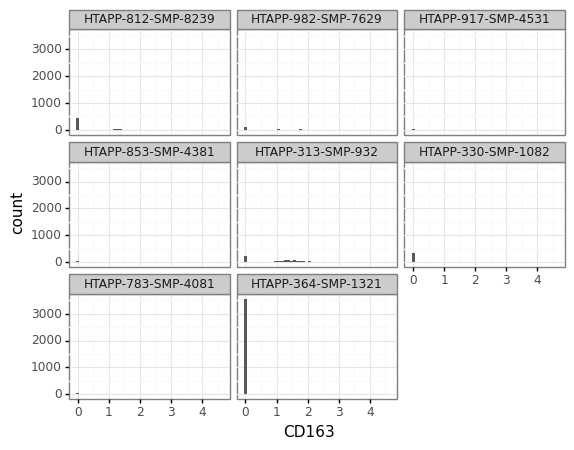

(                       CD163
 sample                      
 HTAPP-812-SMP-8239  0.255208
 HTAPP-982-SMP-7629  0.739336
 HTAPP-917-SMP-4531  0.787736
 HTAPP-853-SMP-4381  0.562500
 HTAPP-313-SMP-932   0.764706
 HTAPP-330-SMP-1082  0.115486
 HTAPP-783-SMP-4081  0.425000
 HTAPP-364-SMP-1321  0.079287,
 <ggplot: (2958972524776)>)

In [247]:
get_percent_expressing(adatas_combined_macro_clean['scRNAseq'],'CD163',0,sc_mode=True)

/secure/src/anaconda3/envs/scanpy/lib/python3.6/site-packages/plotnine/stats/stat_bin.py:93: PlotnineWarning: 'stat_bin()' using 'bins = 23'. Pick better value with 'binwidth'.


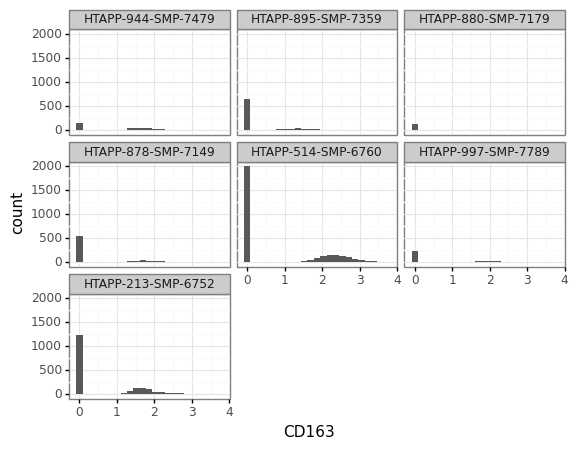

(                       CD163
 sample                      
 HTAPP-944-SMP-7479  0.598425
 HTAPP-895-SMP-7359  0.222222
 HTAPP-880-SMP-7179  0.254438
 HTAPP-878-SMP-7149  0.242637
 HTAPP-514-SMP-6760  0.321502
 HTAPP-997-SMP-7789  0.311047
 HTAPP-213-SMP-6752  0.356430,
 <ggplot: (2958700655389)>)

In [246]:
get_percent_expressing(adatas_combined_macro_clean['snRNAseq'],'CD163',0,sc_mode=True)

/secure/src/anaconda3/envs/scanpy/lib/python3.6/site-packages/plotnine/stats/stat_bin.py:93: PlotnineWarning: 'stat_bin()' using 'bins = 44'. Pick better value with 'binwidth'.


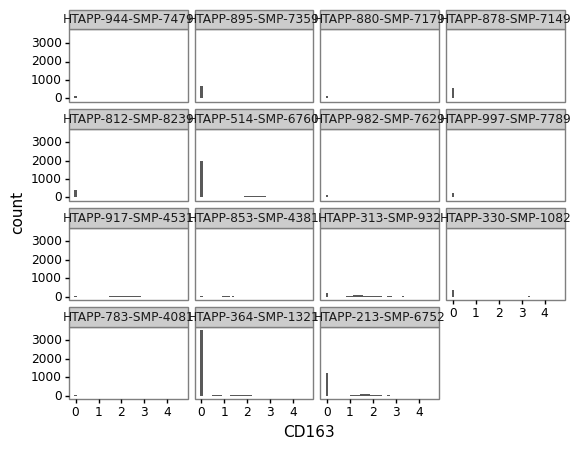

(                       CD163
 sample                      
 HTAPP-944-SMP-7479  0.598425
 HTAPP-895-SMP-7359  0.222222
 HTAPP-880-SMP-7179  0.254438
 HTAPP-878-SMP-7149  0.242637
 HTAPP-812-SMP-8239  0.255208
 HTAPP-514-SMP-6760  0.321502
 HTAPP-982-SMP-7629  0.739336
 HTAPP-997-SMP-7789  0.311047
 HTAPP-917-SMP-4531  0.787736
 HTAPP-853-SMP-4381  0.562500
 HTAPP-313-SMP-932   0.764706
 HTAPP-330-SMP-1082  0.115486
 HTAPP-783-SMP-4081  0.425000
 HTAPP-364-SMP-1321  0.079287
 HTAPP-213-SMP-6752  0.356430,
 <ggplot: (-9223369078105181089)>)

In [61]:
get_percent_expressing(adatas_combined_macro_clean['scnRNAseq'],'CD163',0,sc_mode=True)

#### different spatial distribution of +/- cells

In [74]:
expr_df_mf=sc.get.obs_df(adatas_combined_macro_clean['merfish'],keys=['CD163','sample','replicate','x', 'y'],use_raw=True)

In [77]:
sub=expr_df_mf[expr_df_mf['sample']=='HTAPP-812-SMP-8239'].copy()

In [78]:
sub['CD163+']=sub['CD163']>0
sub['top']=sub['y']>4000

In [83]:
sub.value_counts(['CD163+','top'])

CD163+  top  
True    True     59
        False    56
False   False    18
        True      9
dtype: int64

In [85]:
table = np.array([[59, 56], [9, 18]])
table

array([[59, 56],
       [ 9, 18]])

In [86]:
sp.stats.fisher_exact(table)

(2.107142857142857, 0.13328253644188492)

In [89]:
#fractions of +
print('top: '+str(59/(59+9))+' bottom:'+str(56/(56+18)))

top: 0.8676470588235294 bottom:0.7567567567567568


### Comparing average expression of interesting genes

In [190]:
expression_df=pd.DataFrame()
for method in ['scnRNAseq','snRNAseq',*all_methods]:
    get_genes=int_genes.copy()
    for k in list(get_genes.keys()):
        get_genes[k] = [gene for gene in get_genes[k] if gene in list(adatas_combined_macro_clean[method].raw.var.index)]
        if len(get_genes[k]) ==0:
            del(get_genes[k])
    for gene_set in list(get_genes.keys()):
#get normalized values        
        df=sc.get.obs_df(adatas_combined_macro_clean[method], keys=['sample',*get_genes[gene_set]], use_raw=True)
#get the raw values instead of normalized
#        gene_indices=np.array([ np.argwhere(adatas_combined_macro_clean[method].uns['counts_var'] == k) for k in get_genes[gene_set] ]).flatten()
#        df=pd.DataFrame(adatas_combined_macro_clean[method].obsm['counts'][:,gene_indices].A, index=adatas_combined_macro_clean[method].obs.index, columns=get_genes[gene_set])
#        df['sample']=adatas_combined_macro_clean[method].obs['sample']
        
        df_long=pd.melt(df,id_vars=['sample'])
        df_long['method']=method
        df_long['gene_set']=gene_set
        expression_df=expression_df.append(df_long)


In [191]:
expression_df

,sample,variable,value,method,gene_set
0,HTAPP-944-SMP-7479,CD163,0.000000,scnRNAseq,Canonical MP markers
1,HTAPP-944-SMP-7479,CD163,1.624650,scnRNAseq,Canonical MP markers
2,HTAPP-944-SMP-7479,CD163,1.984061,scnRNAseq,Canonical MP markers
3,HTAPP-944-SMP-7479,CD163,2.053485,scnRNAseq,Canonical MP markers
4,HTAPP-944-SMP-7479,CD163,1.703542,scnRNAseq,Canonical MP markers
...,...,...,...,...,...
17999,HTAPP-364-SMP-1321,PDPN,0.000000,exseq_bin,Other CT markers
18000,HTAPP-364-SMP-1321,PDPN,0.000000,exseq_bin,Other CT markers
18001,HTAPP-364-SMP-1321,PDPN,0.000000,exseq_bin,Other CT markers
18002,HTAPP-364-SMP-1321,PDPN,0.000000,exseq_bin,Other CT markers


In [192]:
expression_df_cond=expression_df.groupby(['sample','variable','method','gene_set']).mean('value').reset_index()

In [238]:
expression_df_cond.to_csv(combined_dir+"mp_int_genes_expression.tsv",sep='\t')

In [162]:
# only use for raw values
# expression_df_cond['log_value']=np.log10(expression_df_cond['value']+1)

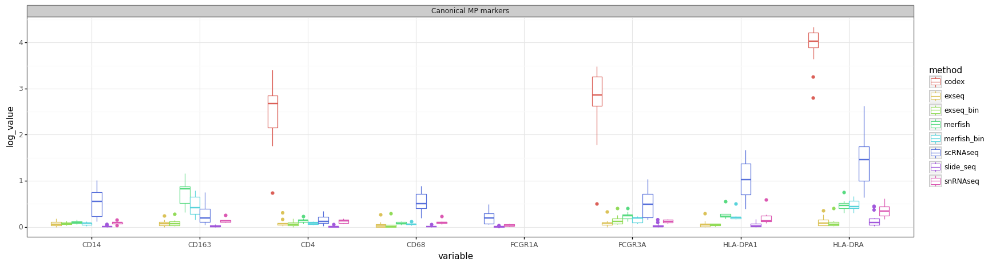

<ggplot: (-9223369041091184303)>

In [163]:
#raw values

pl.options.figure_size = (20, 5)
pl.ggplot(expression_df_cond[(expression_df_cond['gene_set'].isin(['Canonical MP markers']))&(expression_df_cond['method']!='scnRNAseq')],
          pl.aes(x='variable',y='log_value',color='method'))+pl.geom_boxplot(position = pl.position_dodge(preserve = "single"))+pl.facet_grid('~gene_set',scales='free',space='free')+pl.theme_bw()

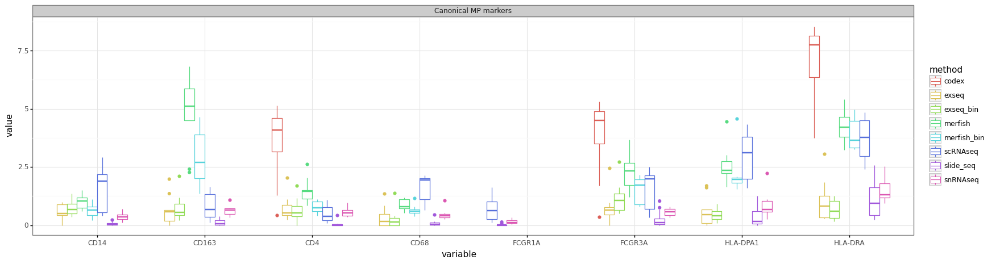

<ggplot: (2995764206561)>

In [145]:
#nromalized values
pl.options.figure_size = (20, 5)
pl.ggplot(expression_df_cond[(expression_df_cond['gene_set'].isin(['Canonical MP markers']))&(expression_df_cond['method']!='scnRNAseq')],
          pl.aes(x='variable',y='value',color='method'))+pl.geom_boxplot(position = pl.position_dodge(preserve = "single"))+pl.facet_grid('~gene_set',scales='free',space='free')+pl.theme_bw()

/secure/src/anaconda3/envs/scanpy/lib/python3.6/site-packages/plotnine/ggplot.py:729: PlotnineWarning: Saving 20 x 4 in image.
/secure/src/anaconda3/envs/scanpy/lib/python3.6/site-packages/plotnine/ggplot.py:730: PlotnineWarning: Filename: /scratch/projects/HTAPP_MBC/spatial//01_typing//combined_all//mp_all_bp_expression.pdf


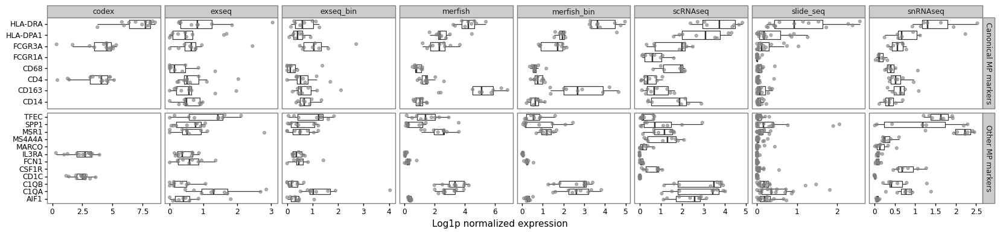

In [205]:
#normalized values
pl.options.figure_size = (20, 4)
fig=(pl.ggplot(expression_df_cond[(expression_df_cond['gene_set'].isin(['Canonical MP markers','Other MP markers']))&(expression_df_cond['method']!='scnRNAseq')],
           pl.aes(x='variable',y='value'))+pl.geom_boxplot(outlier_shape='')+
 pl.geom_point(color='grey',alpha=0.6,position = pl.position_jitter(width=0.3))+
 pl.facet_grid('gene_set~method',scales='free',space='free')+pl.coord_flip()+pl.ylim(-0.00001,None)+
     pl.ylab("Log1p normalized expression")+pl.xlab(""))
fig.draw(True)
fig.save(combined_dir+'/mp_all_bp_expression.pdf',bbox_inches='tight');

In [207]:
expression_df_cond_sub=expression_df_cond[(~expression_df_cond['gene_set'].isin(['Other CT markers']))&(expression_df_cond['method']!='scnRNAseq')]

In [208]:
expression_df_cond_wide=expression_df_cond_sub.pivot(columns="method",index=["gene_set","variable","sample"],values="value",)
expression_df_cond_wide.head()

method                                            codex     exseq  exseq_bin  \
gene_set             variable sample                                           
Canonical MP markers CD14     HTAPP-213-SMP-6752    NaN       NaN        NaN   
                              HTAPP-313-SMP-932     NaN  0.274900   0.356283   
                              HTAPP-330-SMP-1082    NaN  0.498758   0.522902   
                              HTAPP-364-SMP-1321    NaN  0.924701   1.348624   
                              HTAPP-514-SMP-6760    NaN  0.000000   0.425811   

method                                             merfish  merfish_bin  \
gene_set             variable sample                                      
Canonical MP markers CD14     HTAPP-213-SMP-6752       NaN          NaN   
                              HTAPP-313-SMP-932   0.587346     0.418016   
                              HTAPP-330-SMP-1082       NaN          NaN   
                              HTAPP-364-SMP-1321       NaN          NaN   
                              HTAPP-514-SMP-6760  1.491121     1.100168   

method                                            scRNAseq  slide_seq  \
gene_set             variable sample                                    
Canonical MP markers CD14     HTAPP-213-SMP-6752       NaN   0.050854   
                              HTAPP-313-SMP-932   1.812990   0.026496   
                              HTAPP-330-SMP-1082  0.393197   0.013961   
                              HTAPP-364-SMP-1321  0.414665   0.041349   
                              HTAPP-514-SMP-6760       NaN   0.120791   

method                                            snRNAseq  
gene_set             variable sample                        
Canonical MP markers CD14     HTAPP-213-SMP-6752  0.388129  
                              HTAPP-313-SMP-932        NaN  
                              HTAPP-330-SMP-1082       NaN  
                              HTAPP-364-SMP-1321       NaN  
                              HTAPP-514-SMP-6760  0.524933

In [234]:
cors=expression_df_cond_wide.corr(method="spearman")
cors

method,codex,exseq,exseq_bin,merfish,merfish_bin,scRNAseq,slide_seq,snRNAseq
method,,,,,,,,
codex,1.000000,-0.036364,-0.034723,0.651015,0.630593,0.553825,0.349616,0.643120
exseq,-0.036364,1.000000,0.872563,0.102503,0.076213,0.073496,0.047315,0.266141
exseq_bin,-0.034723,0.872563,1.000000,0.099511,0.095210,0.032980,0.003020,0.171643
merfish,0.651015,0.102503,0.099511,1.000000,0.927780,0.642473,0.481524,0.822587
merfish_bin,0.630593,0.076213,0.095210,0.927780,1.000000,0.712496,0.618638,0.756543
scRNAseq,0.553825,0.073496,0.032980,0.642473,0.712496,1.000000,0.507414,NaN
slide_seq,0.349616,0.047315,0.003020,0.481524,0.618638,0.507414,1.000000,0.545889
snRNAseq,0.643120,0.266141,0.171643,0.822587,0.756543,NaN,0.545889,1.000000


In [235]:
#to make sn and sc go together for better comparability - ideal would be to mask, though
cors.fillna(1,inplace=True)

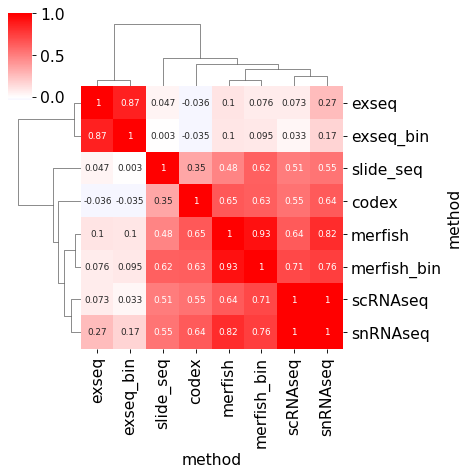

In [236]:
hm=sns.clustermap(cors,cmap="bwr",center=0,dendrogram_ratio=0.2,figsize=[6,6],annot=True,annot_kws={"size": 8})
hm.savefig(combined_dir+"mp_marker_function_avg_expr_cor_hm.pdf")

In [ ]:
    g = sns.PairGrid(expression_df_cond_wide, height=1.6, dropna=False)
#    g.map_diag(sns.histplot)
    g.map_upper(sns.regplot, scatter_kws={"s": 8,"rasterized":True}, line_kws={"color":  "r"})
    g.map_lower(sns.kdeplot, color='blue',shade=True)
    g.savefig(combined_dir+"mp_marker_function_avg_expr_scatter_pairPlot.pdf",dpi=150)

### Correlate clusters

In [213]:
expression_all_df=pd.DataFrame()
for method in ['scnRNAseq','snRNAseq',*all_methods]:
#all genes
    get_genes=list(adatas_combined_macro_clean[method].raw.var.index)
#only codex/merfish
#    get_genes=list(adatas_combined_macro_clean['merfish'].raw.var.index)
#    get_genes=pd.Index(get_genes)[pd.Index(get_genes).isin(list(adatas_combined_macro_clean[method].raw.var.index))]

#get normalized values        
    df=sc.get.obs_df(adatas_combined_macro_clean[method], keys=['sample','harmony_leiden',*get_genes], use_raw=True)
        
    df_long=pd.melt(df,id_vars=['sample','harmony_leiden'])
    df_long['method']=method
    df_long_cond=df_long.groupby(['sample','harmony_leiden','variable','method']).mean('value').reset_index()
    expression_all_df=expression_all_df.append(df_long_cond)


In [214]:
expression_all_df

,sample,harmony_leiden,variable,method,value
0,HTAPP-944-SMP-7479,0,A1BG,scnRNAseq,0.046950
1,HTAPP-944-SMP-7479,0,A1BG-AS1,scnRNAseq,0.050143
2,HTAPP-944-SMP-7479,0,A1CF,scnRNAseq,0.000000
3,HTAPP-944-SMP-7479,0,A2M,scnRNAseq,0.661525
4,HTAPP-944-SMP-7479,0,A2M-AS1,scnRNAseq,0.000000
...,...,...,...,...,...
14347,HTAPP-364-SMP-1321,5,VIM,exseq_bin,2.086060
14348,HTAPP-364-SMP-1321,5,XBP1,exseq_bin,0.000000
14349,HTAPP-364-SMP-1321,5,XCL1,exseq_bin,3.198029
14350,HTAPP-364-SMP-1321,5,ZEB1,exseq_bin,0.727055


In [239]:
expression_all_df.to_csv(combined_dir+"mp_all_genes_cluster_expression.tsv",sep='\t')

In [90]:
expression_all_df=pd.read_csv(combined_dir+"mp_all_genes_cluster_expression.tsv",sep='\t')

In [91]:
expression_all_df_cond=expression_all_df.groupby(['harmony_leiden','variable','method']).mean('value').reset_index()

In [92]:
expression_all_df_cond_sub=expression_all_df_cond[expression_all_df_cond['method']!='scnRNAseq'].copy()

In [94]:
expression_all_df_cond_sub['method_cl']=expression_all_df_cond_sub['method']+'_'+expression_all_df_cond_sub['harmony_leiden'].astype('str')
expression_all_df_cond_sub.head()

,harmony_leiden,variable,method,Unnamed: 0,value,method_cl
0,0,A1BG,scRNAseq,1166973.5,0.125167,scRNAseq_0
2,0,A1BG,slide_seq,687596.0,0.000000,slide_seq_0
3,0,A1BG,snRNAseq,1182129.0,0.033544,snRNAseq_0
4,0,A1BG-AS1,scRNAseq,1166974.5,0.019793,scRNAseq_0
6,0,A1BG-AS1,slide_seq,687597.0,0.012837,slide_seq_0


In [95]:
expression_all_df_cond_sub['value_norm']=expression_all_df_cond_sub.groupby(['method','variable'])['value'].apply(lambda x: (x-x.mean()))

In [264]:
#expression_all_df_cond_sub['value_norm'].fillna(0,inplace=True)

In [219]:
expression_all_df_cond_wide=expression_all_df_cond_sub.pivot(columns="method_cl",index=["variable"],values="value_norm")
expression_all_df_cond_wide.head()

method_cl,codex_0,codex_1,codex_2,codex_3,codex_4,codex_5,codex_6,codex_7,codex_8,codex_9,exseq_0,exseq_1,exseq_2,exseq_3,exseq_4,exseq_5,exseq_6,exseq_bin_0,exseq_bin_1,exseq_bin_2,exseq_bin_3,exseq_bin_4,exseq_bin_5,merfish_0,merfish_1,merfish_10,merfish_11,merfish_12,merfish_13,merfish_14,merfish_15,merfish_2,merfish_3,merfish_4,merfish_5,merfish_6,merfish_7,merfish_8,merfish_9,merfish_bin_0,merfish_bin_1,merfish_bin_2,merfish_bin_3,merfish_bin_4,merfish_bin_5,merfish_bin_6,merfish_bin_7,merfish_bin_8,scRNAseq_0,scRNAseq_1,scRNAseq_10,scRNAseq_2,scRNAseq_3,scRNAseq_4,scRNAseq_5,scRNAseq_6,scRNAseq_7,scRNAseq_8,scRNAseq_9,slide_seq_0,slide_seq_1,slide_seq_2,slide_seq_3,snRNAseq_0,snRNAseq_1,snRNAseq_10,snRNAseq_11,snRNAseq_12,snRNAseq_2,snRNAseq_3,snRNAseq_4,snRNAseq_5,snRNAseq_6,snRNAseq_7,snRNAseq_8,snRNAseq_9
variable,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
A1BG,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.042640,-0.125346,0.100834,-0.121922,-0.004442,-0.079785,0.062313,0.091388,0.263370,-0.140179,-0.003592,0.000000,0.000000,0.000000,0.000000,0.000695,0.001200,-0.032849,-0.025216,0.018071,0.005996,-0.013344,0.017051,-0.029940,-0.018868,0.079690,-0.020393,0.017907
A1BG-AS1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.012304,-0.007115,-0.007489,0.000948,0.009728,-0.001810,0.012964,-0.001943,-0.007489,-0.007489,-0.002611,0.006111,0.001571,-0.000955,-0.006727,0.008251,-0.005127,-0.009244,-0.025383,-0.018073,0.001046,0.042445,-0.011136,-0.021642,0.026923,-0.018970,0.064030,-0.033119
A1CF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.003065,-0.003868,-0.003868,-0.003203,0.011026,-0.003868,-0.000983,-0.001718,0.017281,-0.003868,-0.003868,-0.000262,0.000145,0.000378,-0.000262,0.007478,-0.001071,-0.003484,-0.003484,-0.003484,0.024351,-0.003484,0.000601,-0.003484,-0.003484,-0.003484,-0.003484,-0.003484
A2M,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.273895,-0.647015,-0.010402,-0.515068,-0.198403,-0.158465,0.028882,0.586196,-0.323390,0.374235,0.589534,-0.132458,0.220014,0.105141,-0.192697,0.190669,-0.151804,-0.362531,-0.077088,0.205579,0.234936,-0.009293,-0.007288,-0.052983,0.065931,0.092602,0.070881,-0.199612
A2M-AS1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.016654,-0.019082,0.186594,-0.019082,-0.019082,-0.018645,-0.019082,-0.017720,-0.019082,-0.019082,-0.019082,-0.000102,0.001070,-0.000484,-0.000484,0.001643,-0.000872,0.027405,-0.008082,-0.008082,-0.006922,-0.006128,0.004129,-0.008082,-0.008082,0.011629,0.009525,-0.008082


In [220]:
cors=expression_all_df_cond_wide.corr(method="pearson")
cors.head()

method_cl,codex_0,codex_1,codex_2,codex_3,codex_4,codex_5,codex_6,codex_7,codex_8,codex_9,exseq_0,exseq_1,exseq_2,exseq_3,exseq_4,exseq_5,exseq_6,exseq_bin_0,exseq_bin_1,exseq_bin_2,exseq_bin_3,exseq_bin_4,exseq_bin_5,merfish_0,merfish_1,merfish_10,merfish_11,merfish_12,merfish_13,merfish_14,merfish_15,merfish_2,merfish_3,merfish_4,merfish_5,merfish_6,merfish_7,merfish_8,merfish_9,merfish_bin_0,merfish_bin_1,merfish_bin_2,merfish_bin_3,merfish_bin_4,merfish_bin_5,merfish_bin_6,merfish_bin_7,merfish_bin_8,scRNAseq_0,scRNAseq_1,scRNAseq_10,scRNAseq_2,scRNAseq_3,scRNAseq_4,scRNAseq_5,scRNAseq_6,scRNAseq_7,scRNAseq_8,scRNAseq_9,slide_seq_0,slide_seq_1,slide_seq_2,slide_seq_3,snRNAseq_0,snRNAseq_1,snRNAseq_10,snRNAseq_11,snRNAseq_12,snRNAseq_2,snRNAseq_3,snRNAseq_4,snRNAseq_5,snRNAseq_6,snRNAseq_7,snRNAseq_8,snRNAseq_9
method_cl,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
codex_0,1.000000,-0.229251,-0.655880,0.740225,-0.048465,0.036175,0.553155,0.427582,-0.548604,-0.132294,-0.113415,0.123872,-0.161504,0.251051,0.138022,-0.193650,-0.059765,0.059029,-0.132458,0.115717,-0.146972,0.138767,-0.053223,-0.038513,0.170574,0.138442,0.097528,-0.172546,0.028466,-0.173133,0.301914,-0.025562,-0.167373,0.058642,-0.030295,-0.110792,-0.027131,0.387156,-0.088100,0.018816,-0.069214,0.150379,-0.119438,0.153088,0.048064,0.013244,-0.061938,0.034166,0.056018,-0.029961,0.030720,-0.029974,0.032751,-0.092083,-0.052815,0.044079,0.084508,-0.065568,-0.066970,0.146997,-0.019184,-0.051290,-0.056365,-0.163718,-0.061605,-0.012300,0.120203,0.035302,-0.019504,-0.065897,0.006776,0.046635,-0.099050,-0.215855,0.202743,0.040602
codex_1,-0.229251,1.000000,0.373271,-0.202075,0.163482,-0.396397,-0.279419,-0.488823,0.257294,-0.289265,0.218885,-0.047135,0.101572,-0.033384,0.141675,-0.352154,0.001295,0.072457,-0.101088,0.026551,-0.015863,0.269086,-0.203399,0.103223,-0.329482,0.154132,-0.126698,-0.029930,0.231511,-0.277053,-0.008423,-0.062028,-0.057475,0.090356,0.102407,0.104359,-0.114181,-0.013152,0.255733,0.119992,0.018109,-0.382762,-0.239491,-0.077020,-0.389845,0.241115,0.157837,0.461178,0.213938,-0.203456,0.227054,-0.127370,-0.202981,0.244586,0.277488,0.186072,-0.291185,-0.008246,0.053970,-0.351136,0.266577,0.221787,-0.115538,0.153387,-0.021718,-0.012130,-0.305317,0.087548,0.195072,0.280114,-0.094687,0.133204,0.030397,0.248429,-0.173863,-0.346989
codex_2,-0.655880,0.373271,1.000000,-0.776852,0.296147,-0.178021,-0.283966,-0.610973,0.312447,-0.155864,0.291053,-0.028978,-0.013306,-0.130684,-0.054470,-0.101267,0.060188,-0.033066,-0.134025,-0.053422,0.228477,0.021496,-0.012304,-0.054795,-0.011277,0.162307,-0.196088,-0.022606,0.007425,0.060504,-0.142672,-0.132942,0.001443,0.013839,0.200599,0.014320,-0.079197,-0.054439,0.102020,0.230139,-0.061475,-0.212674,0.024164,0.022571,-0.083397,0.097802,-0.052583,0.087758,0.277687,-0.284961,0.170806,-0.290817,-0.220082,0.084288,0.183391,0.185428,-0.098419,0.038496,0.224414,-0.241104,0.296361,0.225095,-0.228627,0.135981,-0.150745,0.091240,-0.168558,0.026922,0.075310,0.248119,-0.155883,0.042645,0.141016,0.227139,-0.196526,-0.222582
codex_3,0.740225,-0.202075,-0.776852,1.000000,-0.111079,0.024818,0.532318,0.523081,-0.504327,-0.174768,-0.237004,-0.043455,-0.110410,0.107688,0.177182,0.062538,-0.037361,0.034173,-0.083466,0.054372,-0.185924,0.056402,0.088989,0.051587,-0.143563,-0.045169,0.087238,-0.056992,-0.042194,-0.028289,0.271965,0.016655,-0.264845,0.030350,0.112096,-0.019584,0.147547,0.267282,-0.087298,-0.129005,-0.058187,0.060093,0.036030,-0.031801,-0.148889,-0.093099,0.090056,0.137311,-0.057506,0.098199,0.028310,0.135801,0.097693,0.010187,-0.039583,-0.173473,0.013816,-0.038317,-0.153611,0.066001,-0.055537,-0.113186,0.093829,-0.148286,0.071226,-0.120694,0.164652,0.127139,0.155289,-0.133139,0.029552,-0.091562,-0.166583,-0.199817,0.099317,0.043085
codex_4,-0.048465,0.163482,0.296147,-0.111079,1.000000,-0.027295,0.334110,-0.341290,-0.111317,-0.526051,0.209404,0.144873,-0.205883,-0.182589,0.007089,-0.342558,0.2158

In [221]:
cors_long=cors.melt(ignore_index=False,var_name='method_cl_2').reset_index()

In [222]:
cors_long['m1']=cors_long['method_cl'].str.rsplit("_",n=1).str[0]
cors_long['m2']=cors_long['method_cl_2'].str.rsplit("_",n=1).str[0]
cors_long['mc1_mc2']=cors_long[['method_cl','method_cl_2']].apply(lambda x: "_".join(sorted([x['method_cl'],x['method_cl_2']])),axis=1)

In [223]:
max_idx=cors_long.groupby(['method_cl','m2'])['value'].idxmax()

In [224]:
cors_long_max=cors_long.iloc[max_idx.values]
cors_long_max_filt=cors_long_max[(cors_long_max['value']>0.4)&(cors_long_max['m1']!=cors_long_max['m2'])].drop_duplicates(subset=['mc1_mc2']).sort_values('method_cl')
cors_long_max_filt.head()

,method_cl,method_cl_2,value,m1,m2,mc1_mc2
3573,codex_1,merfish_bin_8,0.461178,codex,merfish_bin,codex_1_merfish_bin_8
4412,codex_4,scRNAseq_9,0.482013,codex,scRNAseq,codex_4_scRNAseq_9
3123,codex_7,merfish_bin_2,0.467111,codex,merfish_bin,codex_7_merfish_bin_2
2440,codex_8,merfish_3,0.485532,codex,merfish,codex_8_merfish_3
1149,codex_9,exseq_5,0.407505,codex,exseq,codex_9_exseq_5


In [225]:
cors_long_max_filt['method_cl_2_cat']=pd.Categorical(cors_long_max_filt['method_cl_2'], categories=cors_long_max_filt['method_cl_2'].unique())

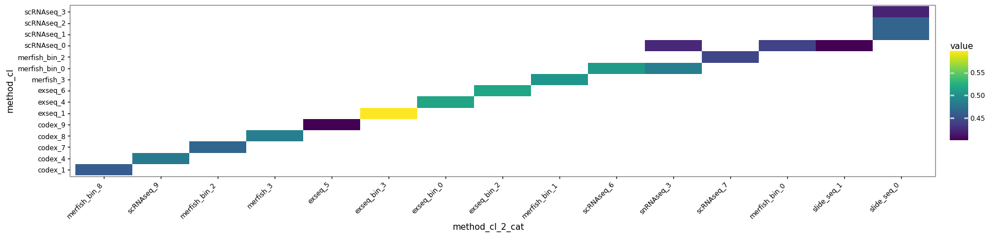

<ggplot: (-9223369094463946503)>

In [230]:
(pl.ggplot(cors_long_max_filt,pl.aes(x='method_cl_2_cat',y='method_cl',fill='value'))+pl.geom_tile()+
 pl.theme(axis_text_x=pl.element_text(rotation=45, hjust=1)))

In [231]:
cors_long_max_wide=cors_long_max.pivot(columns="method_cl_2",index=["method_cl"],values="value",)
cors_long_max_wide.head()

method_cl_2,codex_0,codex_1,codex_2,codex_3,codex_4,codex_5,codex_6,codex_7,codex_8,codex_9,exseq_0,exseq_1,exseq_2,exseq_3,exseq_4,exseq_5,exseq_6,exseq_bin_0,exseq_bin_1,exseq_bin_2,exseq_bin_3,exseq_bin_4,exseq_bin_5,merfish_0,merfish_1,merfish_10,merfish_11,merfish_12,merfish_13,merfish_14,merfish_15,merfish_2,merfish_3,merfish_4,merfish_5,merfish_6,merfish_7,merfish_8,merfish_9,merfish_bin_0,merfish_bin_1,merfish_bin_2,merfish_bin_3,merfish_bin_4,merfish_bin_5,merfish_bin_6,merfish_bin_7,merfish_bin_8,scRNAseq_0,scRNAseq_1,scRNAseq_10,scRNAseq_2,scRNAseq_3,scRNAseq_4,scRNAseq_5,scRNAseq_6,scRNAseq_7,scRNAseq_8,scRNAseq_9,slide_seq_0,slide_seq_1,slide_seq_2,slide_seq_3,snRNAseq_0,snRNAseq_1,snRNAseq_10,snRNAseq_11,snRNAseq_12,snRNAseq_2,snRNAseq_3,snRNAseq_4,snRNAseq_5,snRNAseq_6,snRNAseq_7,snRNAseq_8,snRNAseq_9
method_cl,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
codex_0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.251051,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.138767,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.387156,NaN,NaN,NaN,NaN,NaN,0.153088,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.084508,NaN,NaN,0.146997,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.202743,NaN
codex_1,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.218885,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.269086,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.255733,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.461178,NaN,NaN,NaN,NaN,NaN,NaN,0.277488,NaN,NaN,NaN,NaN,NaN,0.266577,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.280114,NaN,NaN,NaN,NaN,NaN,NaN
codex_2,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.291053,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.228477,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.200599,NaN,NaN,NaN,NaN,0.230139,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.277687,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.296361,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.248119,NaN,NaN,NaN,NaN,NaN,NaN
codex_3,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.177182,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.088989,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.271965,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.137311,NaN,NaN,NaN,0.135801,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.093829,NaN,NaN,NaN,0.164652,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
codex_4,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.215879,NaN,NaN,NaN,NaN,0.254991,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.283628,NaN,NaN,0.146692,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.482013,NaN,0.125466,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.37198,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
cm=sns.clustermap(cors_long_max_wide,cmap="bwr",center=0,row_cluster=False,col_cluster=False,figsize=[20,20],annot=None,yticklabels=True,xticklabels=True)
#cm.savefig(combined_dir+"macrophage_avg_expr_cor_hm.pdf")

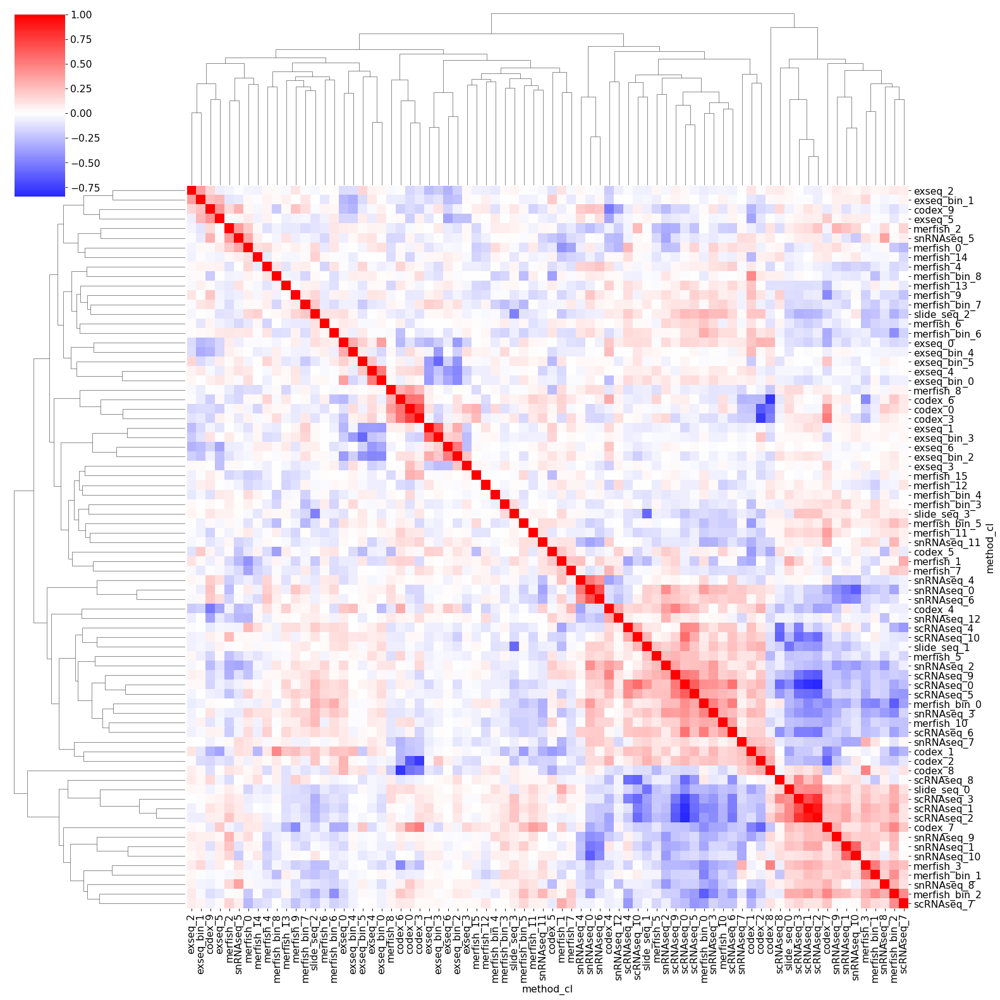

In [233]:
cm=sns.clustermap(cors,cmap="bwr",center=0,dendrogram_ratio=0.2,figsize=[20,20],annot=None,yticklabels=True,xticklabels=True)
cm.savefig(combined_dir+"mp_cluster_avg_expr_cor_hm.pdf")

In [96]:
#check expression of mp genes in two clusters
cl1=['codex_8','scRNAseq_8','slide_seq_0','scRNAseq_3','scRNAseq_1','scRNAseq_2','codex_7','snRNAseq_9','snRNAseq_1','snRNAseq_10','merfish_3','merfish_bin_1','snRNAseq_8','merfish_bin_2','scRNAseq_7']
cl2=['snRNAseq_4','snRNAseq_0','snRNAseq_6','codex_4','snRNAseq_12','scRNAseq_4','scRNAseq_10','slide_seq_1','merfish_5','snRNAseq_2','scRNAseq_9','scRNAseq_0','scRNAseq_5','merfish_bin_0','snRNAseq_3','merfish_10','scRNAseq_6','snRNAseq_7','codex_1','codex_2']

In [97]:
expression_all_df_cond_sub.head()

,harmony_leiden,variable,method,Unnamed: 0,value,method_cl,value_norm
0,0,A1BG,scRNAseq,1166973.5,0.125167,scRNAseq_0,-0.042640
2,0,A1BG,slide_seq,687596.0,0.000000,slide_seq_0,0.000000
3,0,A1BG,snRNAseq,1182129.0,0.033544,snRNAseq_0,0.000695
4,0,A1BG-AS1,scRNAseq,1166974.5,0.019793,scRNAseq_0,0.012304
6,0,A1BG-AS1,slide_seq,687597.0,0.012837,slide_seq_0,0.006111


In [139]:
int_genes_simpl=int_genes
del(int_genes_simpl['Other CT markers'])

In [140]:
int_genes_simpl=[i for s in int_genes_simpl.values() for i in s ]

In [141]:
sel=expression_all_df_cond_sub[(expression_all_df_cond_sub['variable'].isin(int_genes_simpl))&(expression_all_df_cond_sub['method_cl'].isin([*cl1,*cl2]))].copy()

In [142]:
sel.loc[sel['method_cl'].isin(cl1),'cl']='cl1'
sel.loc[sel['method_cl'].isin(cl2),'cl']='cl2'

In [143]:
sel

,harmony_leiden,variable,method,Unnamed: 0,value,method_cl,value_norm,cl
20007,0,AIF1,merfish_bin,10482.0,0.354592,merfish_bin_0,0.112928,cl2
20008,0,AIF1,scRNAseq,1173187.5,2.551955,scRNAseq_0,0.580440,cl2
20010,0,AIF1,slide_seq,688934.0,0.097405,slide_seq_0,-0.130869,cl1
20011,0,AIF1,snRNAseq,1188343.0,0.060285,snRNAseq_0,-0.005705,cl2
30076,0,APOC1,merfish_bin,10487.0,2.190460,merfish_bin_0,-0.188032,cl2
...,...,...,...,...,...,...,...,...
1194783,12,S100A8,snRNAseq,1570789.0,0.000000,snRNAseq_12,-0.012583,cl2
1194785,12,S100A9,snRNAseq,1570790.0,0.016808,snRNAseq_12,-0.021051,cl2
1196324,12,SPP1,snRNAseq,1572316.0,2.496825,snRNAseq_12,1.447095,cl2
1197198,12,TFEC,snRNAseq,1573182.0,0.661909,snRNAseq_12,-0.711657,cl2


In [163]:
medians=sel.groupby(['variable','cl'])['value_norm'].median().unstack()
medians['diff']=medians['cl1']-medians['cl2']
medians=medians.sort_values('diff')
medians

cl,cl1,cl2,diff
variable,,,
FTL,-0.680644,0.520299,-1.200943
HLA-DRA,-0.532714,0.327188,-0.859901
C1QB,-0.463924,0.363256,-0.827180
HLA-DPA1,-0.345940,0.391554,-0.737493
APOE,-0.449497,0.245218,-0.694715
C1QA,-0.411892,0.276663,-0.688554
TMSB4X,-0.295212,0.371816,-0.667028
FTH1,-0.332288,0.325484,-0.657773
MSR1,-0.277407,0.365320,-0.642727


In [160]:
sel['variable']=sel['variable'].astype(pd.CategoricalDtype(categories=medians.index,ordered=True))

/secure/src/anaconda3/envs/scanpy/lib/python3.6/site-packages/plotnine/ggplot.py:729: PlotnineWarning: Saving 4 x 7 in image.
/secure/src/anaconda3/envs/scanpy/lib/python3.6/site-packages/plotnine/ggplot.py:730: PlotnineWarning: Filename: /scratch/projects/HTAPP_MBC/spatial//01_typing//combined_all//mp_bp_cluster_norm_expression.pdf


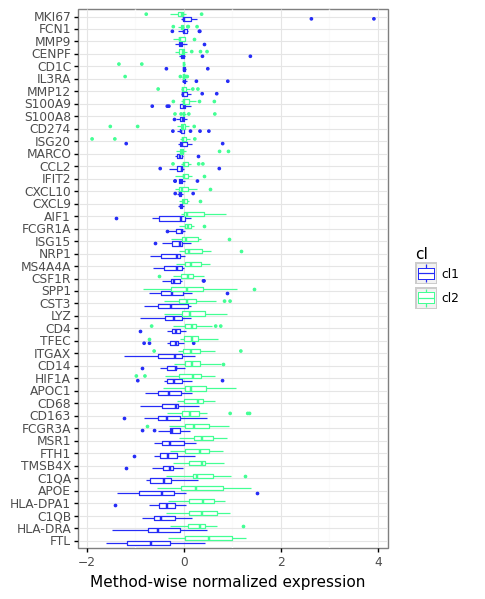

In [225]:
fig=(pl.ggplot(sel,pl.aes(x='variable',y='value_norm',color='cl'))+
 pl.geom_boxplot(outlier_size=0.5)+
 pl.coord_flip()+ 
 pl.theme(figure_size=(4, 7))+
 pl.ylab('Method-wise normalized expression')+
 pl.xlab('')+
 pl.scale_color_manual({'cl1':'#252cf7','cl2':'#43ff94'}))
fig.draw(True)
fig.save(combined_dir+'/mp_bp_cluster_norm_expression.pdf',bbox_inches='tight');
#set dpi back to normal (not sure why needed)
plt.rcParams['figure.dpi']=72

### Macro-TNK subtype coloc

In [18]:
adatas_combined_macro_TNK=adatas_combined.copy()
for method in all_methods:
    print(method)
    adatas_combined_macro_TNK[method].obs=adatas_combined_macro_TNK[method].obs.rename(columns={"OT":"cell_type"})
    adatas_combined_macro_TNK[method]=adatas_combined_macro_TNK[method][adatas_combined_macro_TNK[method].obs["cell_type"].isin({"Macrophage","T","NK"})].copy()    

scRNAseq
slide_seq
merfish
merfish_bin
codex
exseq
exseq_bin


In [19]:
adatas_combined_macro_TNK['merfish']

AnnData object with n_obs × n_vars = 10069 × 291
    obs: 'replicate', 'RCTD', 'cell_type', 'OT_max', 'x', 'y', 'sample', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_counts', 'leiden', 'method', 'receptors_biopsy', 'site_biopsy', 'x_100', 'y_100', 'bin_100'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mean', 'std'
    uns: 'counts_var', 'hvg', 'leiden', 'neighbors', 'pca', 'umap'
    obsm: 'OT', 'OT_max', 'RCTD', 'X_pca', 'X_umap', 'counts'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [20]:
macroTNK_df_mf=sc.get.obs_df(adatas_combined_macro_TNK['merfish'],keys=['CD163','APOE','CTLA4','PDCD1','LAG3','CD63','sample','replicate','cell_type','x_100', 'y_100', 'bin_100'],use_raw=True)

In [21]:
macroTNK_df_mf.loc[macroTNK_df_mf['cell_type'].isin(['T','NK']),'cell_type2']='TNK'
macroTNK_df_mf.loc[macroTNK_df_mf['cell_type'].isin(['Macrophage']),'cell_type2']='Macrophage'

In [22]:
macroTNK_df_mf.head()

,CD163,APOE,CTLA4,PDCD1,LAG3,CD63,sample,replicate,cell_type,x_100,y_100,bin_100,cell_type2
cell100055028584513184012934650853783284421-1-HTAPP-944-SMP-7479,0.000000,0.0,0.0,0.0,0.0,0.0,HTAPP-944-SMP-7479,1,NK,7,13,250,TNK
cell100997542130396122082980927205608971282-1-HTAPP-944-SMP-7479,0.000000,0.0,0.0,0.0,0.0,0.0,HTAPP-944-SMP-7479,1,NK,10,20,2031,TNK
cell101046130242685136272363067870219566740-1-HTAPP-944-SMP-7479,0.000000,0.0,0.0,0.0,0.0,0.0,HTAPP-944-SMP-7479,1,NK,15,51,2717,TNK
cell101622012606264391655479937382477436630-1-HTAPP-944-SMP-7479,5.386288,0.0,0.0,0.0,0.0,0.0,HTAPP-944-SMP-7479,1,NK,7,13,250,TNK
cell102242627259208862784959885785460218816-1-HTAPP-944-SMP-7479,0.000000,0.0,0.0,0.0,0.0,0.0,HTAPP-944-SMP-7479,1,NK,16,52,55,TNK


In [23]:
macroTNK_df_mf_means=macroTNK_df_mf.groupby(['sample','bin_100','cell_type2'])[['CD163','APOE','CTLA4','PDCD1','LAG3','CD63']].mean().unstack()

In [24]:
macroTNK_df_mf_means.columns=['_'.join(col).strip() for col in macroTNK_df_mf_means.columns.values]
macroTNK_df_mf_means=macroTNK_df_mf_means.reset_index()
macroTNK_df_mf_means

,sample,bin_100,CD163_Macrophage,CD163_TNK,APOE_Macrophage,APOE_TNK,CTLA4_Macrophage,CTLA4_TNK,PDCD1_Macrophage,PDCD1_TNK,LAG3_Macrophage,LAG3_TNK,CD63_Macrophage,CD63_TNK
0,HTAPP-944-SMP-7479,0,6.804505,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.00000,4.511849,5.717127
1,HTAPP-944-SMP-7479,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,HTAPP-944-SMP-7479,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,HTAPP-944-SMP-7479,9,7.878492,0.0,0.000000,0.0,0.0,0.0,0.0,1.792523,0.0,0.00000,0.000000,0.865096
4,HTAPP-944-SMP-7479,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24952,HTAPP-313-SMP-932,4422,7.372689,NaN,0.000000,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.000000,NaN
24953,HTAPP-313-SMP-932,4423,2.190894,0.0,2.072202,0.0,0.0,0.0,0.0,0.000000,0.0,2.97742,1.960311,0.000000
24954,HTAPP-313-SMP-932,4425,7.866989,NaN,0.000000,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.000000,NaN
24955,HTAPP-313-SMP-932,4426,0.000000,NaN,5.795659,NaN,0.0,NaN,0.0,NaN,0.0,NaN,0.000000,NaN


In [25]:
cors_macroTNK=macroTNK_df_mf_means[['CD163_Macrophage','APOE_Macrophage','CTLA4_TNK','PDCD1_TNK','LAG3_TNK','CD63_TNK']].corr()

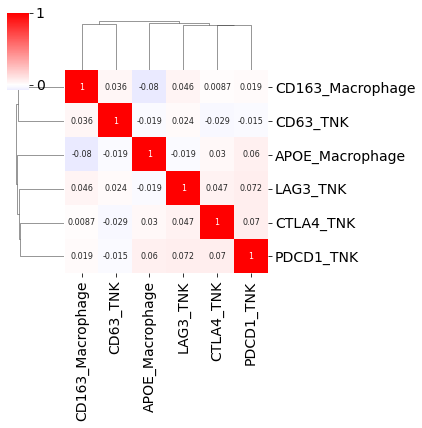

In [29]:
plt.rcParams['figure.dpi']=72
hm=sns.clustermap(cors_macroTNK,cmap="bwr",center=0,dendrogram_ratio=0.2,figsize=[6,6],annot=True,annot_kws={"size": 8})
#hm.savefig(combined_dir+"mp_macro_TNK_avg_expr_cor_hm.pdf")

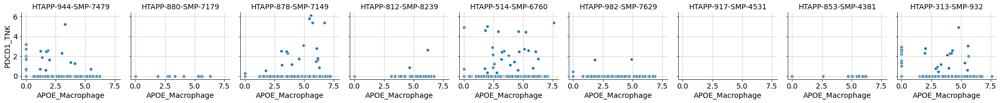

In [244]:
g = sns.FacetGrid(macroTNK_df_mf_means, col="sample")
g.map(sns.scatterplot, "APOE_Macrophage", "PDCD1_TNK")
g.set_titles(col_template="{col_name}")

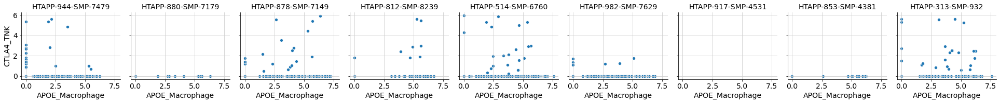

In [245]:
g = sns.FacetGrid(macroTNK_df_mf_means, col="sample")
g.map(sns.scatterplot, "APOE_Macrophage", "CTLA4_TNK")
g.set_titles(col_template="{col_name}")

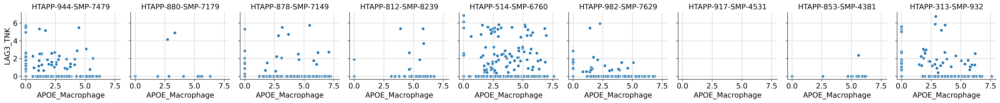

In [27]:
g = sns.FacetGrid(macroTNK_df_mf_means, col="sample")
g.map(sns.scatterplot, "APOE_Macrophage", "LAG3_TNK")
g.set_titles(col_template="{col_name}")

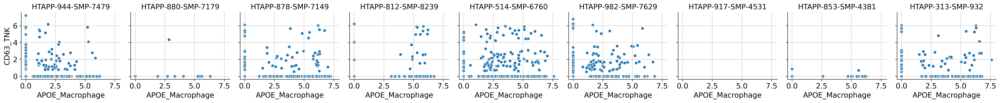

In [28]:
g = sns.FacetGrid(macroTNK_df_mf_means, col="sample")
g.map(sns.scatterplot, "APOE_Macrophage", "CD63_TNK")
g.set_titles(col_template="{col_name}")